<a href="https://colab.research.google.com/github/ali-talebi/proposal_master/blob/main/Simulation_1403_08_04_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install fitter

In [1]:
import pandas as pd
from sklearn.metrics import r2_score
import numpy  as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
import os
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier , ExtraTreesClassifier
# from fitter import Fitter, get_common_distributions, get_distributions
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense , Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


In [2]:
root_path = '/content/drive/MyDrive/Malek_Master/code/Total_Data_Simulation'

In [3]:
total_file_link = []
for i in os.listdir(root_path) :
  total_file_link.append(root_path+f'/{i}')

In [4]:
pd.read_csv(total_file_link[2])

,r/R,mean_delta_x,std_delta_x,mean_delta_y,std_delta_y,mean_delta_z,std_delta_z
0,0.2001,0.0434,0.0026,-0.0126,0.0013,-0.0162,0.0040
1,0.2499,-0.0157,0.0019,-0.0235,0.0031,-0.0061,0.0079
2,0.2998,-0.0418,0.0016,-0.0514,0.0053,-0.0781,0.0130
3,0.3498,-0.0550,0.0016,-0.0961,0.0091,-0.1268,0.0216
4,0.3913,-0.0646,0.0024,-0.1332,0.0133,-0.1839,0.0303
5,0.4496,-0.1020,0.0026,-0.1704,0.0173,-0.3251,0.0405
6,0.4997,-0.1255,0.0030,-0.2004,0.0207,-0.4803,0.0503
7,0.5387,-0.1535,0.0028,-0.2193,0.0230,-0.6758,0.0569
8,0.5996,-0.1964,0.0031,-0.2466,0.0273,-0.9893,0.0678
9,0.6498,-0.2235,0.0031,-0.2726,0.0316,-1.3829,0.0783


In [5]:
total_alpha_content = [ i / 1000 for i in range( 1 , 10  )  ]
total_flat_content  = [ i for i in range(1 , 5  ) ]
total_location      = list(range( 5 , 16))

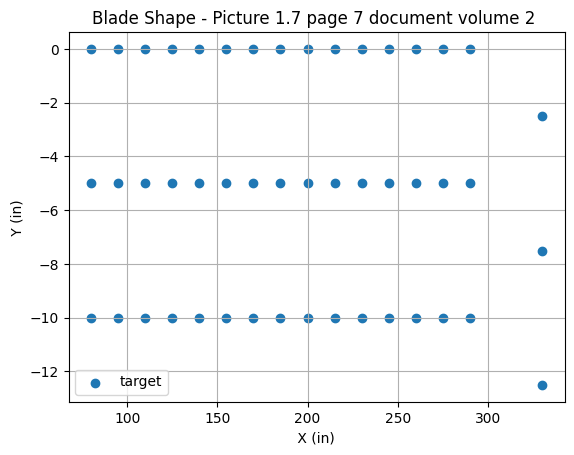

In [6]:
points = []
start_x = 65
start_y = [0 , -5 , -10.0 ]
for i in range(15) :
  start_x +=  15

  for j in range(3) :
    points.append([start_x , start_y[j] , 0 ] )

points.append([330 , -2.5 , 0 ])
points.append([330 , -7.5 , 0 ])
points.append([330 , -12.5 , 0 ])
total_points = np.array(points)
plt.scatter(total_points[ : ,  0 ] , total_points[ : , 1 ] , label = "target" )
plt.legend()
plt.title("Blade Shape - Picture 1.7 page 7 document volume 2 ")
plt.xlabel(" X (in) ")
plt.ylabel(" Y (in) ")
plt.grid()
plt.show()

In [7]:
total_simulation = {
    'bias_correlation' : [] ,
    'betha_0_correlation' : [] ,
    'betha_1_correlation' : [] ,
    'betha_2_correlation' : [] ,
    'betha_3_correlation' : [] ,
    'betha_4_correlation' : [] ,
    'betha_5_correlation' : [] ,
    'alpha' : [] ,
    'flap'  : [] ,
    'accuracy_nav' : [] ,

    'accuracy_random_forest' : [] ,
    'n_estimators_RF' : [] ,
    'max_features_RF' : [] ,
    'max_depth_RF'    : [] ,
    'criterion_RF'    : [] ,

    'accuracy_extra_classifier' : [] ,
    'accuracy_svc_' : [] ,
    'C_svc'         : [] ,
    'kernel_svc'    : [] ,
    'gamma_svc'     : [] ,
    'ann'           : []


}



MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH = {
    'mean_bias'    : [] ,
    'std_bias'     : [] ,
    'mean_betha_0' : [] ,
    'std_betha_0'  : [] ,
    'mean_betha_1' : [] ,
    'std_betha_1'  : [] ,
    'mean_betha_2' : [] ,
    'std_betha_2'  : [] ,
    'mean_betha_3' : [] ,
    'std_betha_3'  : [] ,
    'mean_betha_4' : [] ,
    'std_betha_4'  : [] ,
    'mean_betha_5' : [] ,
    'std_betha_5'  : [] ,
}



MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T = {
    'mean_bias'    : [] ,
    'std_bias'     : [] ,
    'mean_betha_0' : [] ,
    'std_betha_0'  : [] ,
    'mean_betha_1' : [] ,
    'std_betha_1'  : [] ,
    'mean_betha_2' : [] ,
    'std_betha_2'  : [] ,
    'mean_betha_3' : [] ,
    'std_betha_3'  : [] ,
    'mean_betha_4' : [] ,
    'std_betha_4'  : [] ,
    'mean_betha_5' : [] ,
    'std_betha_5'  : [] ,
}


MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT = {
    'mean_bias'    : [] ,
    'std_bias'     : [] ,
    'mean_betha_0' : [] ,
    'std_betha_0'  : [] ,
    'mean_betha_1' : [] ,
    'std_betha_1'  : [] ,
    'mean_betha_2' : [] ,
    'std_betha_2'  : [] ,
    'mean_betha_3' : [] ,
    'std_betha_3'  : [] ,
    'mean_betha_4' : [] ,
    'std_betha_4'  : [] ,
    'mean_betha_5' : [] ,
    'std_betha_5'  : [] ,
}



MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T = {
    'mean_bias'    : [] ,
    'std_bias'     : [] ,
    'mean_betha_0' : [] ,
    'std_betha_0'  : [] ,
    'mean_betha_1' : [] ,
    'std_betha_1'  : [] ,
    'mean_betha_2' : [] ,
    'std_betha_2'  : [] ,
    'mean_betha_3' : [] ,
    'std_betha_3'  : [] ,
    'mean_betha_4' : [] ,
    'std_betha_4'  : [] ,
    'mean_betha_5' : [] ,
    'std_betha_5'  : [] ,
}


iter_alpha : 0.001 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9859252814947709
r2_score in Simulation Failt  void  for Each Blade :  0.9622484330128827
Error in Simulation Fault for Each Blade :  1.044104651743451  --- r2_score Fault S ----  0.9845620954615546
Error in Simulation Fault T  for Each Blade :  1.044104651743451  --- r2_score Fault T :  0.9810457998790374
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9895034099950656
r2_score in Simulation Failt  void  for Each Blade :  0.9753395836103743
Error in Simulation Fault for Each Blade :  -0.16995181803477344  --- r2_score Fault S ----  0.989979113772756
Error in Simulation Fault T  for Each Blade :  -0.16995181803477344  --- r2_score Fault T :  0.9898046434804404
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.970723475694312
r2_score in Simulation Failt  void  for Each Blade :  0.9693487421305093
Error in Simulation Fault 

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
23 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.14      0.16      0.15        88
         1.0       0.15      0.21      0.18        76
         2.0       0.48      0.23      0.31       199
         3.0       0.14      0.42      0.21        33

    accuracy                           0.23       396
   macro avg       0.23      0.26      0.21       396
weighted avg       0.32      0.23      0.24       396

accuracy accuracy_random_forest  : 0.3434343434343434
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - acc: 0.2598 - loss: 1.4272 - val_acc: 0.2222 - val_loss: 1.4030
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2759 - loss: 1.3937 - val_acc: 0.2197 - val_loss: 1.3954
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2506 - loss: 1.3913 - val_acc: 0.2020 - val_loss: 1.3921
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2776 - loss: 1.3862 - val_acc: 0.2146 - val_loss: 1.3921
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2693 - loss: 1.3963 - val_acc: 0.2172 - val_loss: 1.3927
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2919 - loss: 1.3847 - val_acc: 0.2172 - val_loss: 1.3931
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2879 - loss: 1.3817 - val_acc: 0.2197 - val_loss: 1.3928
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3001 - loss: 1.3666 - val_acc: 0.2323 - val_loss: 1.3929
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2894 - loss

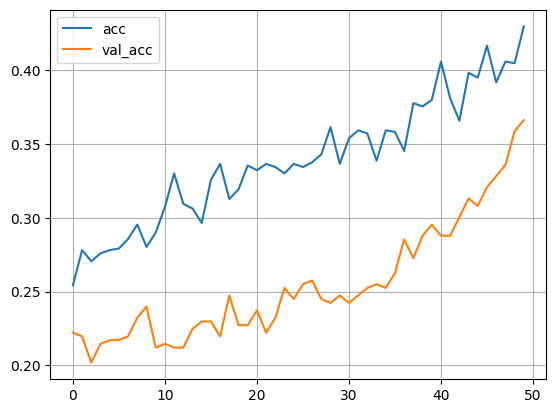

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3489 - loss: 1.2829 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.001 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9924317356396568
r2_score in Simulation Failt  void  for Each Blade :  0.9827925821122534
Error in Simulation Fault for Each Blade :  1.193289305114141  --- r2_score Fault S ----  0.9845733709917064
Error in Simulation Fault T  for Each Blade :  1.193289305114141  --- r2_score Fault T :  0.983167097918874
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9873123861123652
r2_score in Simulation Failt  void  for Each Blade :  0.9761227430580568
Error in Simulation Fault for Each Blade :  -1.7959710182474862  --- r2_score Fault S ----  0.976798068592863
Error in Simulation Fault T  for Each Blade :  -1.7959710182474862  --- r2_score Fault T :  0.9691870020198098
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
26 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.22      0.17      0.19       127
         1.0       0.11      0.32      0.17        37
         2.0       0.34      0.24      0.28       135
         3.0       0.23      0.24      0.24        97

    accuracy                           0.22       396
   macro avg       0.23      0.24      0.22       396
weighted avg       0.25      0.22      0.23       396

accuracy accuracy_random_forest  : 0.3055555555555556
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - acc: 0.3012 - loss: 1.4666 - val_acc: 0.2702 - val_loss: 1.4284
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2704 - loss: 1.4397 - val_acc: 0.2475 - val_loss: 1.4113
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2512 - loss: 1.4086 - val_acc: 0.2374 - val_loss: 1.4062
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2536 - loss: 1.3997 - val_acc: 0.2525 - val_loss: 1.4050
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2788 - loss: 1.3996 - val_acc: 0.2298 - val_loss: 1.4022
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2654 - loss: 1.3847 - val_acc: 0.2247 - val_loss: 1.4003
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2992 - loss: 1.3790 - val_acc: 0.2551 - val_loss: 1.3983
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2609 - loss: 1.3861 - val_acc: 0.2525 - val_loss: 1.3974
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3125 - loss: 1.3718 - v

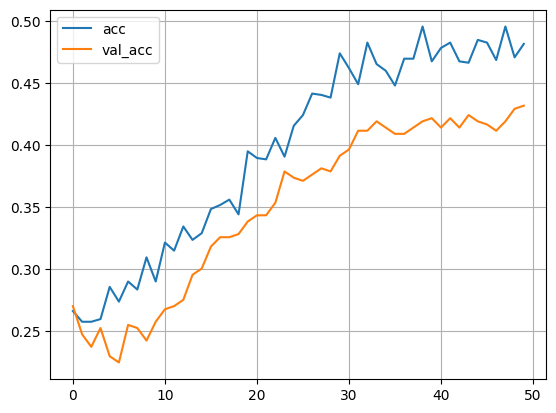

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4373 - loss: 1.1013 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.001 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9928193314815261
r2_score in Simulation Failt  void  for Each Blade :  0.9968853280873641
Error in Simulation Fault for Each Blade :  -0.8062145423435654  --- r2_score Fault S ----  0.9836003535533159
Error in Simulation Fault T  for Each Blade :  -0.8062145423435654  --- r2_score Fault T :  0.9850857419330836
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9937855209520419
r2_score in Simulation Failt  void  for Each Blade :  0.9618953203390546
Error in Simulation Fault for Each Blade :  -1.5258364543067295  --- r2_score Fault S ----  0.9752609461735522
Error in Simulation Fault T  for Each Blade :  -1.5258364543067295  --- r2_score Fault T :  0.9731675393711827
 ----- for each Blade Simulated ----- 


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
38 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.20      0.26      0.22        74
         1.0       0.22      0.27      0.24        86
         2.0       0.34      0.30      0.32       108
         3.0       0.30      0.23      0.26       128

    accuracy                           0.26       396
   macro avg       0.26      0.26      0.26       396
weighted avg       0.27      0.26      0.26       396

accuracy accuracy_random_forest  : 0.27525252525252525
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - acc: 0.2565 - loss: 1.4019 - val_acc: 0.2449 - val_loss: 1.4081
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2665 - loss: 1.3991 - val_acc: 0.2626 - val_loss: 1.4000
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3044 - loss: 1.3935 - val_acc: 0.2626 - val_loss: 1.3953
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2822 - loss: 1.3811 - val_acc: 0.2525 - val_loss: 1.3938
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2689 - loss: 1.3899 - val_acc: 0.2424 - val_loss: 1.3926
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2840 - loss: 1.3779 - val_acc: 0.2525 - val_loss: 1.3910
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3035 - loss: 1.3767 - val_acc: 0.2500 - val_loss: 1.3883
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3168 - loss: 1.3672 - val_acc: 0.2576 - val_loss: 1.3882
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3270 - loss: 1.3662 - 

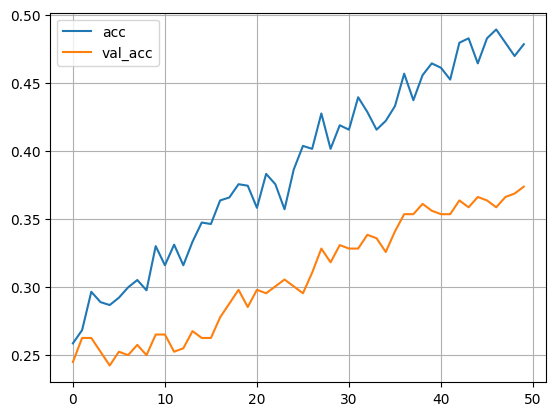

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3970 - loss: 1.1737 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.001 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9897981304289012
r2_score in Simulation Failt  void  for Each Blade :  0.9864131459491613
Error in Simulation Fault for Each Blade :  2.0458861379875852  --- r2_score Fault S ----  0.947162450240559
Error in Simulation Fault T  for Each Blade :  2.0458861379875852  --- r2_score Fault T :  0.9884040290239835
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.976098415460193
r2_score in Simulation Failt  void  for Each Blade :  0.9782505866669962
Error in Simulation Fault for Each Blade :  -0.4760580657867022  --- r2_score Fault S ----  0.9771077422343467
Error in Simulation Fault T  for Each Blade :  -0.4760580657867022  --- r2_score Fault T :  0.9623539053505763
 ----- for each Blade Simulated ----- 
r2_s

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
38 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.20      0.24      0.22        79
         1.0       0.38      0.29      0.33       138
         2.0       0.15      0.25      0.18        57
         3.0       0.32      0.25      0.28       122

    accuracy                           0.26       396
   macro avg       0.26      0.26      0.25       396
weighted avg       0.29      0.26      0.27       396

accuracy accuracy_random_forest  : 0.2803030303030303
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - acc: 0.2295 - loss: 1.5173 - val_acc: 0.2298 - val_loss: 1.4511
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2753 - loss: 1.4289 - val_acc: 0.2374 - val_loss: 1.4207
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2703 - loss: 1.4197 - val_acc: 0.2323 - val_loss: 1.4088
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2742 - loss: 1.3896 - val_acc: 0.2424 - val_loss: 1.4004
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2747 - loss: 1.3868 - val_acc: 0.2525 - val_loss: 1.3953
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2805 - loss: 1.3792 - val_acc: 0.2500 - val_loss: 1.3919
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2800 - loss: 1.3855 - val_acc: 0.2677 - val_loss: 1.3887
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3074 - loss: 1.3630 - val_acc: 0.2778 - val_loss: 1.3853
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3111 - loss: 1.3633 - v

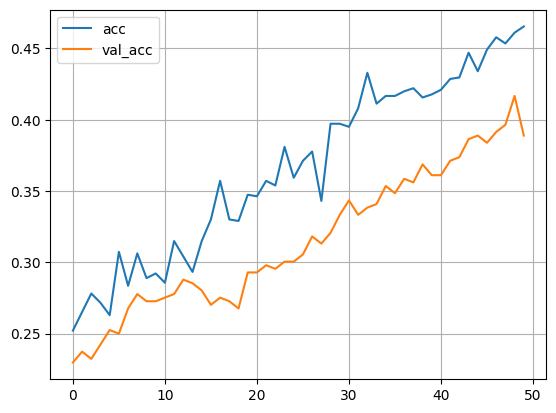

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3717 - loss: 1.1791 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.002 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9603446357710452
r2_score in Simulation Failt  void  for Each Blade :  0.9921611064591865
Error in Simulation Fault for Each Blade :  0.4528997361310778  --- r2_score Fault S ----  0.9713023296078578
Error in Simulation Fault T  for Each Blade :  0.4528997361310778  --- r2_score Fault T :  0.9740428305039339
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9739247346297556
r2_score in Simulation Failt  void  for Each Blade :  0.9754592721131179
Error in Simulation Fault for Each Blade :  1.0947549166739061  --- r2_score Fault S ----  0.9748907653457798
Error in Simulation Fault T  for Each Blade :  1.0947549166739061  --- r2_score Fault T :  0.9444592061499905
 ----- for each Blade Simulated ----- 
r2_s

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
16 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.15      0.21      0.18        73
         1.0       0.36      0.24      0.28       161
         2.0       0.16      0.22      0.18        68
         3.0       0.20      0.21      0.21        94

    accuracy                           0.22       396
   macro avg       0.22      0.22      0.21       396
weighted avg       0.25      0.22      0.23       396

accuracy accuracy_random_forest  : 0.3055555555555556
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - acc: 0.2347 - loss: 1.4134 - val_acc: 0.2424 - val_loss: 1.4122
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - acc: 0.2538 - loss: 1.4171 - val_acc: 0.2449 - val_loss: 1.4015
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2514 - loss: 1.3990 - val_acc: 0.2424 - val_loss: 1.3977
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2499 - loss: 1.3879 - val_acc: 0.2348 - val_loss: 1.3979
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2659 - loss: 1.3799 - val_acc: 0.2475 - val_loss: 1.3973
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2765 - loss: 1.3886 - val_acc: 0.2374 - val_loss: 1.3982
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2668 - loss: 1.3804 - val_acc: 0.2146 - val_loss: 1.3991
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2837 - loss: 1.3778 - val_acc: 0.2146 - val_loss: 1.3994
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2582 - loss: 1.3876 - v

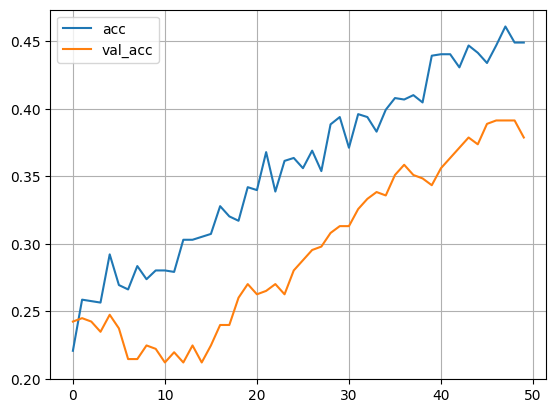

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3517 - loss: 1.1863 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.002 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9811503068731422
r2_score in Simulation Failt  void  for Each Blade :  0.961988986059729
Error in Simulation Fault for Each Blade :  0.019381537147753036  --- r2_score Fault S ----  0.9759927569217788
Error in Simulation Fault T  for Each Blade :  0.019381537147753036  --- r2_score Fault T :  0.9711612478976254
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.979581114816002
r2_score in Simulation Failt  void  for Each Blade :  0.9740087305402284
Error in Simulation Fault for Each Blade :  -1.7141027039711874  --- r2_score Fault S ----  0.9659090147184702
Error in Simulation Fault T  for Each Blade :  -1.7141027039711874  --- r2_score Fault T :  0.972536312430994
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
44 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.25      0.26      0.26        91
         1.0       0.18      0.22      0.20        87
         2.0       0.26      0.23      0.24       110
         3.0       0.23      0.21      0.22       108

    accuracy                           0.23       396
   macro avg       0.23      0.23      0.23       396
weighted avg       0.23      0.23      0.23       396

accuracy accuracy_random_forest  : 0.3181818181818182
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - acc: 0.2383 - loss: 1.5865 - val_acc: 0.2551 - val_loss: 1.4661
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.2199 - loss: 1.4940 - val_acc: 0.2828 - val_loss: 1.4115
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2773 - loss: 1.4210 - val_acc: 0.2778 - val_loss: 1.3959
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2403 - loss: 1.4125 - val_acc: 0.2727 - val_loss: 1.3927
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2565 - loss: 1.3954 - val_acc: 0.2778 - val_loss: 1.3906
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2718 - loss: 1.3986 - val_acc: 0.2500 - val_loss: 1.3893
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2734 - loss: 1.3877 - val_acc: 0.2273 - val_loss: 1.3894
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3133 - loss: 1.3619 - val_acc: 0.2449 - val_loss: 1.3893
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2810 - loss: 1.3717 - v

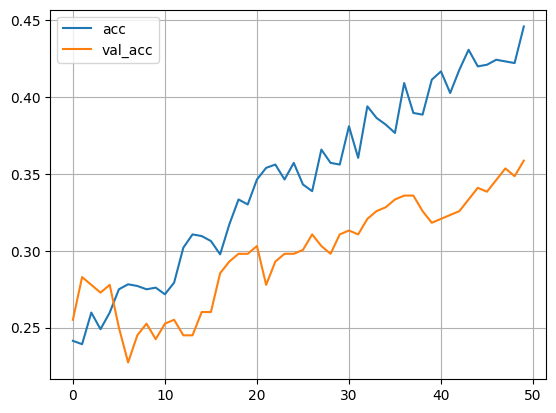

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3603 - loss: 1.2403 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.002 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9867857031595221
r2_score in Simulation Failt  void  for Each Blade :  0.9919891426187404
Error in Simulation Fault for Each Blade :  0.9684157942937159  --- r2_score Fault S ----  0.9751570595858711
Error in Simulation Fault T  for Each Blade :  0.9684157942937159  --- r2_score Fault T :  0.9807192065736993
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9632971319699645
r2_score in Simulation Failt  void  for Each Blade :  0.9631943829230729
Error in Simulation Fault for Each Blade :  0.889147367849926  --- r2_score Fault S ----  0.9847420918861749
Error in Simulation Fault T  for Each Blade :  0.889147367849926  --- r2_score Fault T :  0.974308449591537
 ----- for each Blade Simulated ----- 
r2_scor

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
14 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.19      0.19      0.19        97
         1.0       0.15      0.22      0.18        72
         2.0       0.41      0.25      0.31       156
         3.0       0.15      0.21      0.18        71

    accuracy                           0.22       396
   macro avg       0.23      0.22      0.21       396
weighted avg       0.26      0.22      0.23       396

accuracy accuracy_random_forest  : 0.2803030303030303
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - acc: 0.2511 - loss: 1.4080 - val_acc: 0.2424 - val_loss: 1.4032
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - acc: 0.2544 - loss: 1.3984 - val_acc: 0.2601 - val_loss: 1.3970
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2450 - loss: 1.3864 - val_acc: 0.2677 - val_loss: 1.3960
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2664 - loss: 1.3925 - val_acc: 0.2753 - val_loss: 1.3944
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2752 - loss: 1.3897 - val_acc: 0.2727 - val_loss: 1.3925
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3041 - loss: 1.3728 - val_acc: 0.2626 - val_loss: 1.3925
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2849 - loss: 1.3709 - val_acc: 0.2298 - val_loss: 1.3910
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3252 - loss: 1.3606 - val_acc: 0.2576 - val_loss: 1.3883
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3350 - loss: 1.3692 - v

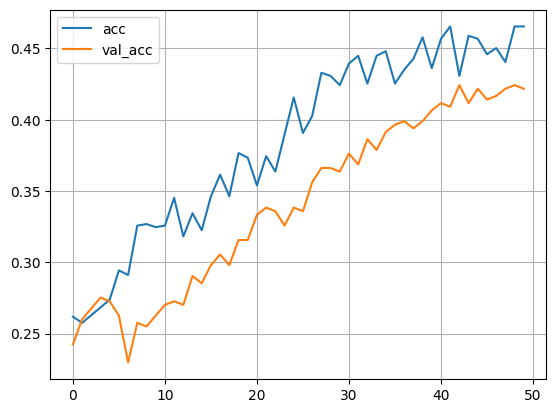

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.4102 - loss: 1.1499 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.002 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.98676395773535
r2_score in Simulation Failt  void  for Each Blade :  0.9876491293106625
Error in Simulation Fault for Each Blade :  1.0373702605032378  --- r2_score Fault S ----  0.9830854296356795
Error in Simulation Fault T  for Each Blade :  1.0373702605032378  --- r2_score Fault T :  0.9727380669076738
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9914286504042706
r2_score in Simulation Failt  void  for Each Blade :  0.9877498078649105
Error in Simulation Fault for Each Blade :  -0.985290806443647  --- r2_score Fault S ----  0.9846875169289457
Error in Simulation Fault T  for Each Blade :  -0.985290806443647  --- r2_score Fault T :  0.9738780471685685
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.38      0.24      0.29       155
         1.0       0.21      0.28      0.24        79
         2.0       0.33      0.26      0.29       119
         3.0       0.09      0.21      0.13        43

    accuracy                           0.25       396
   macro avg       0.25      0.25      0.24       396
weighted avg       0.30      0.25      0.26       396

accuracy accuracy_random_forest  : 0.30303030303030304
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - acc: 0.2649 - loss: 1.4410 - val_acc: 0.2449 - val_loss: 1.4173
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2696 - loss: 1.4087 - val_acc: 0.2348 - val_loss: 1.4040
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2871 - loss: 1.3851 - val_acc: 0.2399 - val_loss: 1.3987
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2796 - loss: 1.3865 - val_acc: 0.2374 - val_loss: 1.3969
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2759 - loss: 1.3845 - val_acc: 0.2197 - val_loss: 1.3955
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2706 - loss: 1.3781 - val_acc: 0.2146 - val_loss: 1.3946
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2744 - loss: 1.3801 - val_acc: 0.2146 - val_loss: 1.3937
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2808 - loss: 1.3779 - val_acc: 0.2348 - val_loss: 1.3918
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2944 - loss: 1.3678 - v

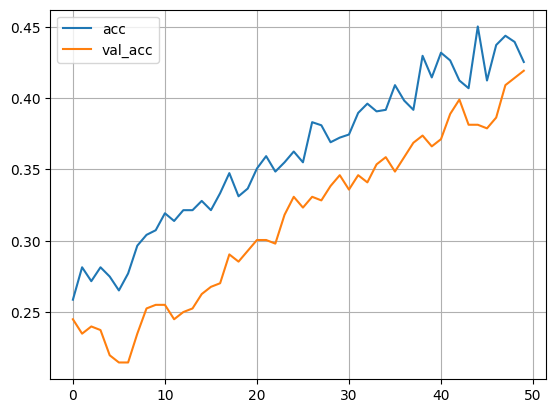

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.4113 - loss: 1.1727 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.003 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9864020686514801
r2_score in Simulation Failt  void  for Each Blade :  0.9884700436382629
Error in Simulation Fault for Each Blade :  1.4540534669824434  --- r2_score Fault S ----  0.9750344981016984
Error in Simulation Fault T  for Each Blade :  1.4540534669824434  --- r2_score Fault T :  0.980712487173271
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9616806759445164
r2_score in Simulation Failt  void  for Each Blade :  0.9851108645667492
Error in Simulation Fault for Each Blade :  1.6093428245324404  --- r2_score Fault S ----  0.9752404653157449
Error in Simulation Fault T  for Each Blade :  1.6093428245324404  --- r2_score Fault T :  0.9899866615800683
 ----- for each Blade Simulated ----- 
r2_sc

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.09      0.15      0.11        62
         1.0       0.36      0.29      0.32       131
         2.0       0.23      0.21      0.22       103
         3.0       0.22      0.22      0.22       100

    accuracy                           0.23       396
   macro avg       0.23      0.22      0.22       396
weighted avg       0.25      0.23      0.24       396

accuracy accuracy_random_forest  : 0.3333333333333333
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - acc: 0.2737 - loss: 1.4659 - val_acc: 0.2020 - val_loss: 1.4315
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2565 - loss: 1.4312 - val_acc: 0.2146 - val_loss: 1.4104
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2795 - loss: 1.4079 - val_acc: 0.2096 - val_loss: 1.4029
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2674 - loss: 1.3799 - val_acc: 0.2172 - val_loss: 1.4005
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2867 - loss: 1.3845 - val_acc: 0.2096 - val_loss: 1.3972
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2855 - loss: 1.3870 - val_acc: 0.2071 - val_loss: 1.3955
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2962 - loss: 1.3785 - val_acc: 0.2197 - val_loss: 1.3949
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2642 - loss: 1.3935 - val_acc: 0.2146 - val_loss: 1.3951
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3184 - loss: 1.3726 - v

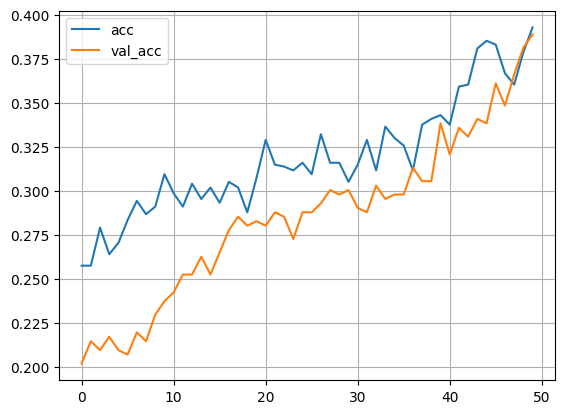

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4207 - loss: 1.2490 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.003 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.976055094709153
r2_score in Simulation Failt  void  for Each Blade :  0.9908115439551193
Error in Simulation Fault for Each Blade :  1.6944875486908915  --- r2_score Fault S ----  0.9868423738246316
Error in Simulation Fault T  for Each Blade :  1.6944875486908915  --- r2_score Fault T :  0.9677481563993062
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9531032696842096
r2_score in Simulation Failt  void  for Each Blade :  0.9782672209033711
Error in Simulation Fault for Each Blade :  0.2910221259703778  --- r2_score Fault S ----  0.9751807510162834
Error in Simulation Fault T  for Each Blade :  0.2910221259703778  --- r2_score Fault T :  0.9730597524059805
 ----- for each Blade Simulated ----- 
r2_sc

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
41 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.20      0.18      0.19       103
         1.0       0.06      0.21      0.09        28
         2.0       0.35      0.21      0.26       157
         3.0       0.26      0.23      0.24       108

    accuracy                           0.21       396
   macro avg       0.21      0.21      0.20       396
weighted avg       0.26      0.21      0.23       396

accuracy accuracy_random_forest  : 0.29545454545454547
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - acc: 0.2359 - loss: 1.4327 - val_acc: 0.2348 - val_loss: 1.4110
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2520 - loss: 1.4117 - val_acc: 0.2500 - val_loss: 1.4019
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2496 - loss: 1.3954 - val_acc: 0.2551 - val_loss: 1.3959
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2800 - loss: 1.3907 - val_acc: 0.2601 - val_loss: 1.3927
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2462 - loss: 1.3889 - val_acc: 0.2828 - val_loss: 1.3905
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2812 - loss: 1.3784 - val_acc: 0.2727 - val_loss: 1.3897
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2624 - loss: 1.3865 - val_acc: 0.2551 - val_loss: 1.3891
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2724 - loss: 1.3750 - val_acc: 0.2601 - val_loss: 1.3879
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2505 - loss: 1.3785 - v

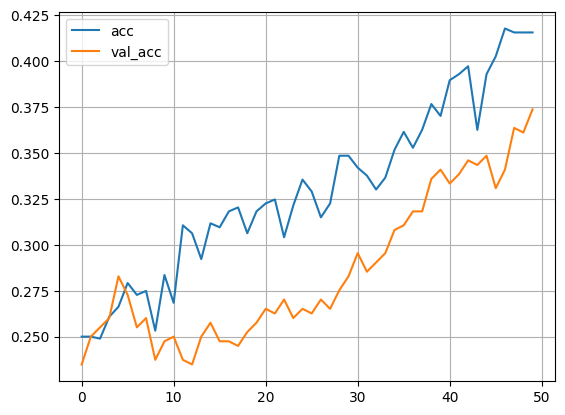

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3245 - loss: 1.2819 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.003 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9858850381241734
r2_score in Simulation Failt  void  for Each Blade :  0.9896788452177347
Error in Simulation Fault for Each Blade :  -0.0005602327967308973  --- r2_score Fault S ----  0.9790185920622149
Error in Simulation Fault T  for Each Blade :  -0.0005602327967308973  --- r2_score Fault T :  0.9927236736376215
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9679213706574001
r2_score in Simulation Failt  void  for Each Blade :  0.9852305903009518
Error in Simulation Fault for Each Blade :  0.6551176756805597  --- r2_score Fault S ----  0.9880825224108775
Error in Simulation Fault T  for Each Blade :  0.6551176756805597  --- r2_score Fault T :  0.963689060323254
 ----- for each Blade Simulated ----

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
26 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.22      0.23      0.22        92
         1.0       0.10      0.34      0.16        32
         2.0       0.45      0.25      0.32       172
         3.0       0.26      0.25      0.25       100

    accuracy                           0.25       396
   macro avg       0.26      0.27      0.24       396
weighted avg       0.32      0.25      0.27       396

accuracy accuracy_random_forest  : 0.3333333333333333
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 134ms/step - acc: 0.2668 - loss: 1.4300 - val_acc: 0.2525 - val_loss: 1.4015
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - acc: 0.2749 - loss: 1.4120 - val_acc: 0.2348 - val_loss: 1.3920
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2605 - loss: 1.4016 - val_acc: 0.2551 - val_loss: 1.3863
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2374 - loss: 1.4013 - val_acc: 0.2424 - val_loss: 1.3847
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2605 - loss: 1.3913 - val_acc: 0.2399 - val_loss: 1.3839
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2637 - loss: 1.3904 - val_acc: 0.2475 - val_loss: 1.3834
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2520 - loss: 1.3919 - val_acc: 0.2652 - val_loss: 1.3821
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2569 - loss: 1.3903 - val_acc: 0.2702 - val_loss: 1.3823
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2728 - loss: 1.3852 - 

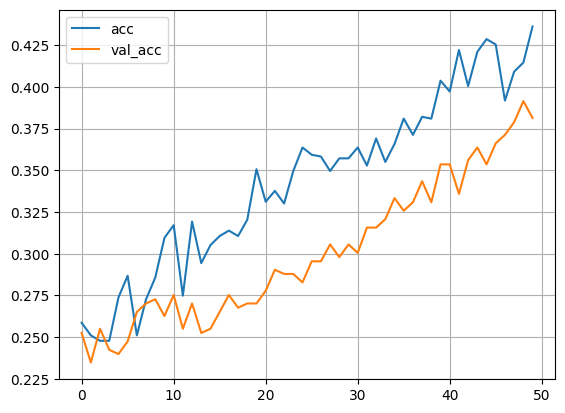

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3867 - loss: 1.2172 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.003 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9769798530165192
r2_score in Simulation Failt  void  for Each Blade :  0.9825916542280907
Error in Simulation Fault for Each Blade :  1.9449688186024723  --- r2_score Fault S ----  0.9568789687511305
Error in Simulation Fault T  for Each Blade :  1.9449688186024723  --- r2_score Fault T :  0.9747684059277198
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9796033011158631
r2_score in Simulation Failt  void  for Each Blade :  0.9858548485094304
Error in Simulation Fault for Each Blade :  -0.9578357226525112  --- r2_score Fault S ----  0.9826112287309493
Error in Simulation Fault T  for Each Blade :  -0.9578357226525112  --- r2_score Fault T :  0.9768019291039953
 ----- for each Blade Simulated ----- 
r2

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
38 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.11      0.17      0.14        65
         1.0       0.47      0.26      0.34       192
         2.0       0.21      0.25      0.23        80
         3.0       0.14      0.24      0.18        59

    accuracy                           0.24       396
   macro avg       0.23      0.23      0.22       396
weighted avg       0.31      0.24      0.26       396

accuracy accuracy_random_forest  : 0.31565656565656564
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - acc: 0.2383 - loss: 1.4465 - val_acc: 0.2500 - val_loss: 1.4277
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2301 - loss: 1.4341 - val_acc: 0.2197 - val_loss: 1.4097
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2350 - loss: 1.4090 - val_acc: 0.2197 - val_loss: 1.4049
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2524 - loss: 1.3927 - val_acc: 0.2273 - val_loss: 1.4006
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2557 - loss: 1.3928 - val_acc: 0.2424 - val_loss: 1.3991
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2785 - loss: 1.3938 - val_acc: 0.2551 - val_loss: 1.3974
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2649 - loss: 1.3902 - val_acc: 0.2500 - val_loss: 1.3958
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2845 - loss: 1.3777 - val_acc: 0.2424 - val_loss: 1.3955
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2975 - loss: 1.3681 - v

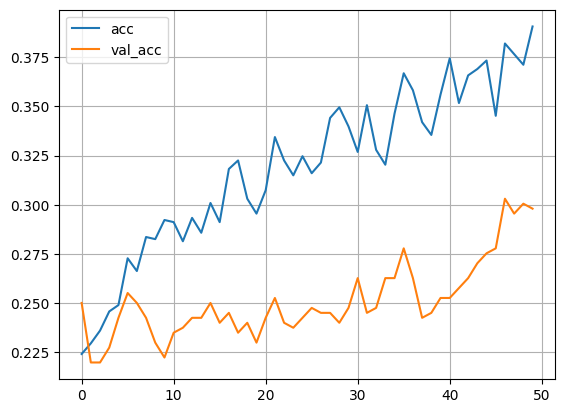

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.2889 - loss: 1.3323 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.004 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9746000150333456
r2_score in Simulation Failt  void  for Each Blade :  0.9725866744914813
Error in Simulation Fault for Each Blade :  1.340762296720949  --- r2_score Fault S ----  0.9790258108020334
Error in Simulation Fault T  for Each Blade :  1.340762296720949  --- r2_score Fault T :  0.9757057485297292
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9606461593783229
r2_score in Simulation Failt  void  for Each Blade :  0.9930729370694805
Error in Simulation Fault for Each Blade :  -1.0443637941500084  --- r2_score Fault S ----  0.9850870749229469
Error in Simulation Fault T  for Each Blade :  -1.0443637941500084  --- r2_score Fault T :  0.9823258727552067
 ----- for each Blade Simulated ----- 
r2_s

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
26 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.40      0.22      0.29       174
         1.0       0.15      0.25      0.19        63
         2.0       0.17      0.24      0.20        68
         3.0       0.23      0.25      0.24        91

    accuracy                           0.24       396
   macro avg       0.24      0.24      0.23       396
weighted avg       0.28      0.24      0.25       396

accuracy accuracy_random_forest  : 0.35858585858585856
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - acc: 0.2886 - loss: 1.4176 - val_acc: 0.2702 - val_loss: 1.4134
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2598 - loss: 1.4121 - val_acc: 0.2652 - val_loss: 1.4051
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2874 - loss: 1.3912 - val_acc: 0.2576 - val_loss: 1.4002
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2698 - loss: 1.3960 - val_acc: 0.2500 - val_loss: 1.3970
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2948 - loss: 1.3718 - val_acc: 0.2551 - val_loss: 1.3961
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2807 - loss: 1.3838 - val_acc: 0.2551 - val_loss: 1.3936
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2956 - loss: 1.3807 - val_acc: 0.2449 - val_loss: 1.3916
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2771 - loss: 1.3760 - val_acc: 0.2525 - val_loss: 1.3903
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3030 - loss: 1.3703 - v

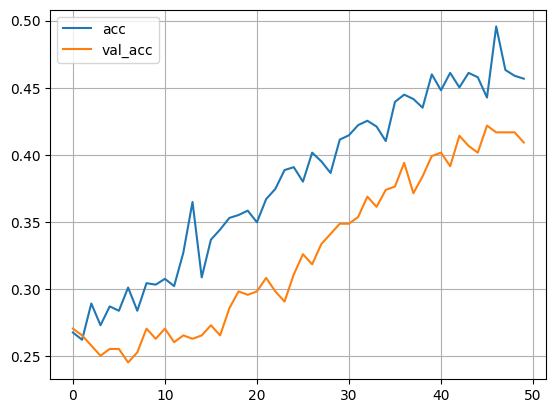

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4224 - loss: 1.1073 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.004 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9852956816530248
r2_score in Simulation Failt  void  for Each Blade :  0.9822735172968009
Error in Simulation Fault for Each Blade :  -1.4789590561753378  --- r2_score Fault S ----  0.9747884632011745
Error in Simulation Fault T  for Each Blade :  -1.4789590561753378  --- r2_score Fault T :  0.9833232103929038
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.989142833941869
r2_score in Simulation Failt  void  for Each Blade :  0.9778765493279258
Error in Simulation Fault for Each Blade :  0.5936191139290639  --- r2_score Fault S ----  0.9930306450835279
Error in Simulation Fault T  for Each Blade :  0.5936191139290639  --- r2_score Fault T :  0.9887431634109557
 ----- for each Blade Simulated ----- 
r2_

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.23      0.20      0.21       111
         1.0       0.36      0.24      0.29       156
         2.0       0.23      0.22      0.23        98
         3.0       0.06      0.19      0.09        31

    accuracy                           0.22       396
   macro avg       0.22      0.21      0.21       396
weighted avg       0.27      0.22      0.24       396

accuracy accuracy_random_forest  : 0.28535353535353536
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - acc: 0.2372 - loss: 1.4882 - val_acc: 0.2424 - val_loss: 1.4285
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2521 - loss: 1.4079 - val_acc: 0.2449 - val_loss: 1.4067
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2762 - loss: 1.3976 - val_acc: 0.2475 - val_loss: 1.3999
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2720 - loss: 1.3944 - val_acc: 0.2399 - val_loss: 1.3955
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2909 - loss: 1.3848 - val_acc: 0.2424 - val_loss: 1.3929
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3005 - loss: 1.3761 - val_acc: 0.2525 - val_loss: 1.3927
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2715 - loss: 1.3823 - val_acc: 0.2626 - val_loss: 1.3907
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2954 - loss: 1.3789 - val_acc: 0.2601 - val_loss: 1.3905
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2801 - loss: 1.3714 - v

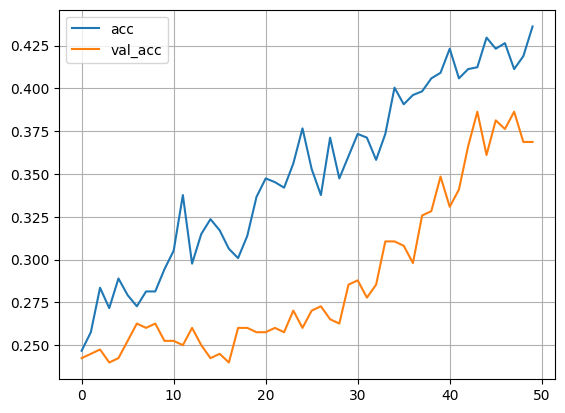

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3979 - loss: 1.2336 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.004 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9764726645895546
r2_score in Simulation Failt  void  for Each Blade :  0.9862180445602334
Error in Simulation Fault for Each Blade :  0.2471476615281012  --- r2_score Fault S ----  0.96044666912191
Error in Simulation Fault T  for Each Blade :  0.2471476615281012  --- r2_score Fault T :  0.9638048871877598
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.986256954075253
r2_score in Simulation Failt  void  for Each Blade :  0.9942354446586369
Error in Simulation Fault for Each Blade :  -0.7285745329357136  --- r2_score Fault S ----  0.990468198142333
Error in Simulation Fault T  for Each Blade :  -0.7285745329357136  --- r2_score Fault T :  0.9713248463477202
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
23 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.14      0.20      0.17        69
         1.0       0.27      0.32      0.29        92
         2.0       0.45      0.27      0.34       157
         3.0       0.26      0.32      0.28        78

    accuracy                           0.28       396
   macro avg       0.28      0.28      0.27       396
weighted avg       0.32      0.28      0.29       396

accuracy accuracy_random_forest  : 0.33585858585858586
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - acc: 0.2368 - loss: 1.4955 - val_acc: 0.2626 - val_loss: 1.4093
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2464 - loss: 1.4212 - val_acc: 0.2551 - val_loss: 1.3940
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2619 - loss: 1.4148 - val_acc: 0.2904 - val_loss: 1.3878
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3168 - loss: 1.3788 - val_acc: 0.2702 - val_loss: 1.3858
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2765 - loss: 1.3893 - val_acc: 0.2727 - val_loss: 1.3851
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2786 - loss: 1.3891 - val_acc: 0.2753 - val_loss: 1.3829
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2828 - loss: 1.3901 - val_acc: 0.2778 - val_loss: 1.3808
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2971 - loss: 1.3787 - val_acc: 0.2929 - val_loss: 1.3789
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3277 - loss: 1.3741 - v

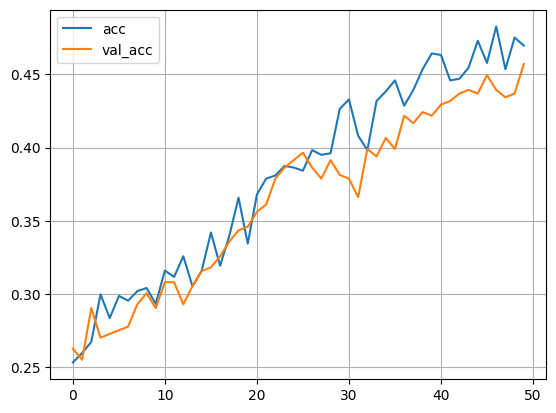

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4440 - loss: 1.0909 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.004 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9569486937938215
r2_score in Simulation Failt  void  for Each Blade :  0.9704554041278172
Error in Simulation Fault for Each Blade :  -0.053018955528056466  --- r2_score Fault S ----  0.9766768473315556
Error in Simulation Fault T  for Each Blade :  -0.053018955528056466  --- r2_score Fault T :  0.9756032954622524
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9877180125630572
r2_score in Simulation Failt  void  for Each Blade :  0.981955343584548
Error in Simulation Fault for Each Blade :  0.7583044717324581  --- r2_score Fault S ----  0.971125720304942
Error in Simulation Fault T  for Each Blade :  0.7583044717324581  --- r2_score Fault T :  0.9898354329136451
 ----- for each Blade Simulated ----- 


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
23 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.49      0.22      0.30       221
         1.0       0.08      0.25      0.12        32
         2.0       0.21      0.26      0.23        78
         3.0       0.14      0.22      0.17        65

    accuracy                           0.23       396
   macro avg       0.23      0.23      0.21       396
weighted avg       0.35      0.23      0.25       396

accuracy accuracy_random_forest  : 0.3409090909090909
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - acc: 0.2513 - loss: 1.4322 - val_acc: 0.2551 - val_loss: 1.3924
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2435 - loss: 1.4076 - val_acc: 0.2576 - val_loss: 1.3852
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2550 - loss: 1.3945 - val_acc: 0.2475 - val_loss: 1.3832
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2578 - loss: 1.3886 - val_acc: 0.2525 - val_loss: 1.3830
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2710 - loss: 1.3854 - val_acc: 0.2576 - val_loss: 1.3824
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2700 - loss: 1.3784 - val_acc: 0.2576 - val_loss: 1.3823
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2834 - loss: 1.3692 - val_acc: 0.2551 - val_loss: 1.3823
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2823 - loss: 1.3738 - val_acc: 0.2449 - val_loss: 1.3814
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2899 - loss: 1.3676 - v

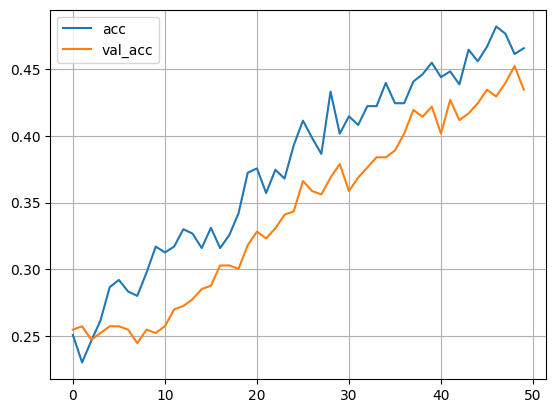

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4407 - loss: 1.0974 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.005 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9799769342170714
r2_score in Simulation Failt  void  for Each Blade :  0.979606397174541
Error in Simulation Fault for Each Blade :  -0.15350017313574438  --- r2_score Fault S ----  0.9762830561456831
Error in Simulation Fault T  for Each Blade :  -0.15350017313574438  --- r2_score Fault T :  0.99139599958595
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9657596458351809
r2_score in Simulation Failt  void  for Each Blade :  0.9748878046651548
Error in Simulation Fault for Each Blade :  0.366157975971674  --- r2_score Fault S ----  0.977708838488864
Error in Simulation Fault T  for Each Blade :  0.366157975971674  --- r2_score Fault T :  0.9843535705851905
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
38 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.51      0.27      0.36       179
         1.0       0.21      0.24      0.22        92
         2.0       0.20      0.28      0.23        68
         3.0       0.14      0.25      0.18        57

    accuracy                           0.26       396
   macro avg       0.26      0.26      0.25       396
weighted avg       0.33      0.26      0.28       396

accuracy accuracy_random_forest  : 0.29797979797979796
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - acc: 0.2359 - loss: 1.5139 - val_acc: 0.2323 - val_loss: 1.4230
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.2545 - loss: 1.4319 - val_acc: 0.2601 - val_loss: 1.3975
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2646 - loss: 1.4059 - val_acc: 0.2601 - val_loss: 1.3931
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2526 - loss: 1.3986 - val_acc: 0.2778 - val_loss: 1.3865
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2698 - loss: 1.3841 - val_acc: 0.2803 - val_loss: 1.3877
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2936 - loss: 1.3688 - val_acc: 0.2904 - val_loss: 1.3848
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2894 - loss: 1.3561 - val_acc: 0.2753 - val_loss: 1.3849
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2671 - loss: 1.3666 - val_acc: 0.2677 - val_loss: 1.3829
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3055 - loss: 1.3566 - v

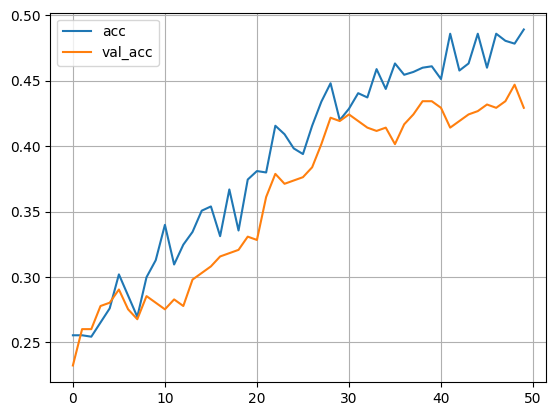

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4330 - loss: 1.0509 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.005 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9927947472353015
r2_score in Simulation Failt  void  for Each Blade :  0.987331037996371
Error in Simulation Fault for Each Blade :  -1.4880677104596267  --- r2_score Fault S ----  0.9823320902203444
Error in Simulation Fault T  for Each Blade :  -1.4880677104596267  --- r2_score Fault T :  0.9745613104995131
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9876563243108374
r2_score in Simulation Failt  void  for Each Blade :  0.9856107681236429
Error in Simulation Fault for Each Blade :  -1.4781279450696536  --- r2_score Fault S ----  0.9859802871248521
Error in Simulation Fault T  for Each Blade :  -1.4781279450696536  --- r2_score Fault T :  0.9875795679311814
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
17 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.48      0.25      0.33       188
         1.0       0.12      0.33      0.18        40
         2.0       0.29      0.24      0.26       117
         3.0       0.13      0.25      0.17        51

    accuracy                           0.26       396
   macro avg       0.26      0.27      0.24       396
weighted avg       0.35      0.26      0.28       396

accuracy accuracy_random_forest  : 0.3055555555555556
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - acc: 0.2596 - loss: 1.4578 - val_acc: 0.2727 - val_loss: 1.4101
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2358 - loss: 1.4235 - val_acc: 0.2652 - val_loss: 1.3999
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2392 - loss: 1.4064 - val_acc: 0.2500 - val_loss: 1.3973
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2353 - loss: 1.4122 - val_acc: 0.2500 - val_loss: 1.3953
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2582 - loss: 1.3985 - val_acc: 0.2551 - val_loss: 1.3937
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2449 - loss: 1.3995 - val_acc: 0.2551 - val_loss: 1.3918
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2568 - loss: 1.3862 - val_acc: 0.2626 - val_loss: 1.3902
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2712 - loss: 1.3892 - val_acc: 0.2601 - val_loss: 1.3901
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2785 - loss: 1.3828 - v

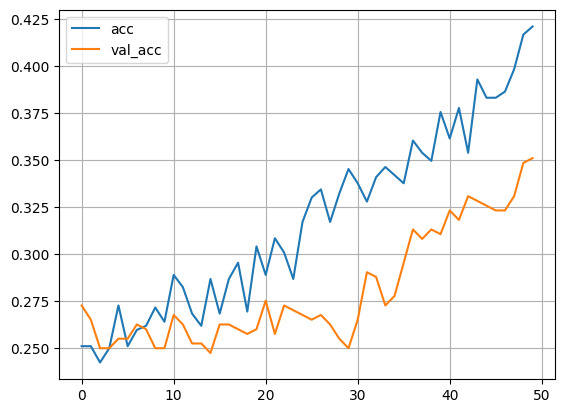

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3389 - loss: 1.2988 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.005 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9839583065893265
r2_score in Simulation Failt  void  for Each Blade :  0.9857371090403492
Error in Simulation Fault for Each Blade :  -0.48843290546395646  --- r2_score Fault S ----  0.9811706628328153
Error in Simulation Fault T  for Each Blade :  -0.48843290546395646  --- r2_score Fault T :  0.9848970021236156
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.979443374208287
r2_score in Simulation Failt  void  for Each Blade :  0.9797978257384204
Error in Simulation Fault for Each Blade :  2.4355605983795847  --- r2_score Fault S ----  0.9682321858972159
Error in Simulation Fault T  for Each Blade :  2.4355605983795847  --- r2_score Fault T :  0.9891379769222808
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
44 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.12      0.26      0.17        47
         1.0       0.12      0.17      0.14        76
         2.0       0.15      0.18      0.16        77
         3.0       0.48      0.24      0.32       196

    accuracy                           0.22       396
   macro avg       0.22      0.21      0.20       396
weighted avg       0.30      0.22      0.24       396

accuracy accuracy_random_forest  : 0.2878787878787879
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - acc: 0.2575 - loss: 1.4876 - val_acc: 0.2601 - val_loss: 1.4387
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2496 - loss: 1.4228 - val_acc: 0.2500 - val_loss: 1.4158
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2665 - loss: 1.4069 - val_acc: 0.2424 - val_loss: 1.4088
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2637 - loss: 1.3946 - val_acc: 0.2652 - val_loss: 1.4047
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2902 - loss: 1.3847 - val_acc: 0.2652 - val_loss: 1.4029
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2942 - loss: 1.3739 - val_acc: 0.2727 - val_loss: 1.4024
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3279 - loss: 1.3635 - val_acc: 0.2778 - val_loss: 1.4018
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3251 - loss: 1.3660 - val_acc: 0.2652 - val_loss: 1.4002
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2586 - loss: 1.3847 - v

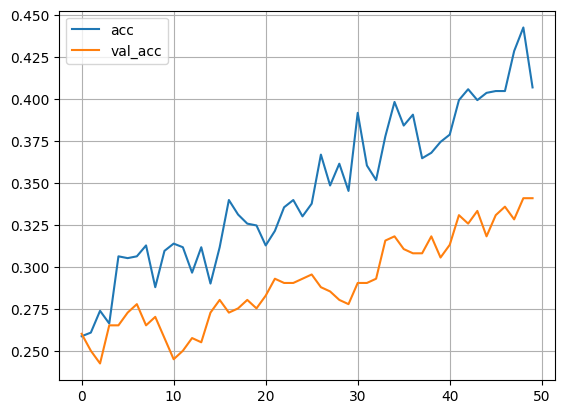

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3340 - loss: 1.2811 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.005 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9843357017024834
r2_score in Simulation Failt  void  for Each Blade :  0.9760898744112014
Error in Simulation Fault for Each Blade :  2.6278667414486847  --- r2_score Fault S ----  0.955884835512421
Error in Simulation Fault T  for Each Blade :  2.6278667414486847  --- r2_score Fault T :  0.9751768671809273
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9846144959543944
r2_score in Simulation Failt  void  for Each Blade :  0.9563588058077827
Error in Simulation Fault for Each Blade :  1.7818037165046272  --- r2_score Fault S ----  0.9600204919289119
Error in Simulation Fault T  for Each Blade :  1.7818037165046272  --- r2_score Fault T :  0.986736341241565
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.61      0.23      0.33       258
         1.0       0.11      0.22      0.15        55
         2.0       0.07      0.24      0.11        29
         3.0       0.13      0.24      0.17        54

    accuracy                           0.23       396
   macro avg       0.23      0.23      0.19       396
weighted avg       0.44      0.23      0.27       396

accuracy accuracy_random_forest  : 0.3005050505050505
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - acc: 0.2882 - loss: 1.4297 - val_acc: 0.2854 - val_loss: 1.4033
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2570 - loss: 1.4099 - val_acc: 0.2475 - val_loss: 1.3944
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2469 - loss: 1.4024 - val_acc: 0.2576 - val_loss: 1.3910
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2650 - loss: 1.3846 - val_acc: 0.2753 - val_loss: 1.3890
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2850 - loss: 1.3818 - val_acc: 0.2677 - val_loss: 1.3859
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2631 - loss: 1.3810 - val_acc: 0.2626 - val_loss: 1.3844
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2876 - loss: 1.3806 - val_acc: 0.2652 - val_loss: 1.3839
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3290 - loss: 1.3630 - val_acc: 0.2702 - val_loss: 1.3845
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2941 - loss: 1.3684 - 

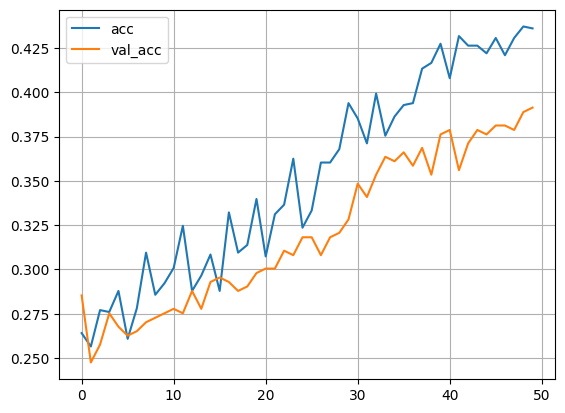

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.3810 - loss: 1.1704 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.006 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9846662650239506
r2_score in Simulation Failt  void  for Each Blade :  0.9890096808588594
Error in Simulation Fault for Each Blade :  0.08301287629845122  --- r2_score Fault S ----  0.9769860042108414
Error in Simulation Fault T  for Each Blade :  0.08301287629845122  --- r2_score Fault T :  0.977857694027927
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9755503826405518
r2_score in Simulation Failt  void  for Each Blade :  0.9785376582875148
Error in Simulation Fault for Each Blade :  -1.2448287589380311  --- r2_score Fault S ----  0.9822316062941235
Error in Simulation Fault T  for Each Blade :  -1.2448287589380311  --- r2_score Fault T :  0.985587254354996
 ----- for each Blade Simulated ----- 
r2

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
22 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.64      0.25      0.35       253
         1.0       0.13      0.24      0.17        59
         2.0       0.09      0.23      0.13        39
         3.0       0.10      0.22      0.14        45

    accuracy                           0.24       396
   macro avg       0.24      0.23      0.20       396
weighted avg       0.45      0.24      0.28       396

accuracy accuracy_random_forest  : 0.31565656565656564
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - acc: 0.2418 - loss: 1.4607 - val_acc: 0.2374 - val_loss: 1.4303
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2805 - loss: 1.4028 - val_acc: 0.2551 - val_loss: 1.4158
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2706 - loss: 1.3993 - val_acc: 0.2551 - val_loss: 1.4100
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2567 - loss: 1.3967 - val_acc: 0.2525 - val_loss: 1.4072
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2828 - loss: 1.3731 - val_acc: 0.2525 - val_loss: 1.4064
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2966 - loss: 1.3773 - val_acc: 0.2525 - val_loss: 1.4038
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2889 - loss: 1.3794 - val_acc: 0.2399 - val_loss: 1.4032
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2869 - loss: 1.3756 - val_acc: 0.2677 - val_loss: 1.4011
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3210 - loss: 1.3707 - v

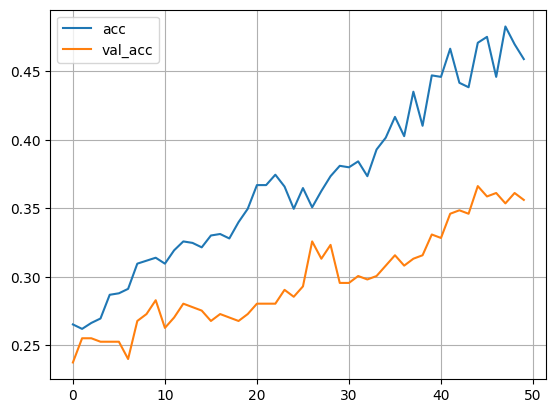

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3442 - loss: 1.2110 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.006 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9547222741478048
r2_score in Simulation Failt  void  for Each Blade :  0.9715002622575997
Error in Simulation Fault for Each Blade :  -0.23921243020618288  --- r2_score Fault S ----  0.9808935693414703
Error in Simulation Fault T  for Each Blade :  -0.23921243020618288  --- r2_score Fault T :  0.9776056859683607
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.985673799601506
r2_score in Simulation Failt  void  for Each Blade :  0.9788738843108685
Error in Simulation Fault for Each Blade :  -1.6085129048746791  --- r2_score Fault S ----  0.980850608449872
Error in Simulation Fault T  for Each Blade :  -1.6085129048746791  --- r2_score Fault T :  0.983875849720376
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
44 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.44      0.26      0.32       168
         1.0       0.10      0.21      0.14        53
         2.0       0.31      0.24      0.27       121
         3.0       0.09      0.17      0.12        54

    accuracy                           0.23       396
   macro avg       0.24      0.22      0.21       396
weighted avg       0.31      0.23      0.25       396

accuracy accuracy_random_forest  : 0.3106060606060606
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - acc: 0.2626 - loss: 1.4263 - val_acc: 0.2348 - val_loss: 1.4179
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2556 - loss: 1.4028 - val_acc: 0.2172 - val_loss: 1.4090
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2684 - loss: 1.4022 - val_acc: 0.2146 - val_loss: 1.4044
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2599 - loss: 1.3959 - val_acc: 0.2096 - val_loss: 1.4031
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2658 - loss: 1.3844 - val_acc: 0.2247 - val_loss: 1.4017
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2718 - loss: 1.3818 - val_acc: 0.2197 - val_loss: 1.4016
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2574 - loss: 1.3842 - val_acc: 0.2374 - val_loss: 1.4004
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2782 - loss: 1.3775 - val_acc: 0.2449 - val_loss: 1.3996
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3045 - loss: 1.3687 - v

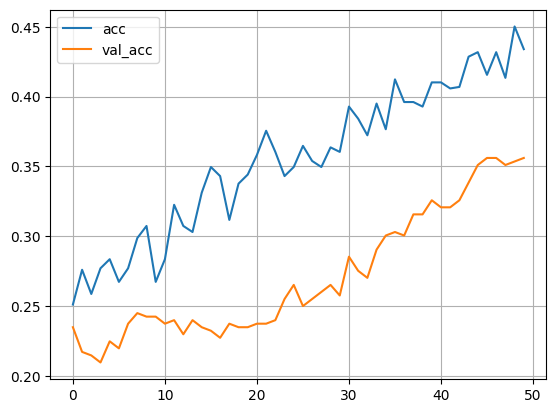

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3618 - loss: 1.2839 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.006 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9884485673437147
r2_score in Simulation Failt  void  for Each Blade :  0.9829801851591357
Error in Simulation Fault for Each Blade :  0.12033143566627169  --- r2_score Fault S ----  0.9841051237955323
Error in Simulation Fault T  for Each Blade :  0.12033143566627169  --- r2_score Fault T :  0.9707505112187249
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9904311155899417
r2_score in Simulation Failt  void  for Each Blade :  0.9628131336686692
Error in Simulation Fault for Each Blade :  0.5746273462182094  --- r2_score Fault S ----  0.9932662463704661
Error in Simulation Fault T  for Each Blade :  0.5746273462182094  --- r2_score Fault T :  0.9895015938592978
 ----- for each Blade Simulated ----- 
r2

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
44 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.35      0.22      0.27       154
         1.0       0.28      0.23      0.25       130
         2.0       0.14      0.22      0.17        59
         3.0       0.09      0.17      0.12        53

    accuracy                           0.22       396
   macro avg       0.22      0.21      0.20       396
weighted avg       0.26      0.22      0.23       396

accuracy accuracy_random_forest  : 0.3005050505050505
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - acc: 0.2389 - loss: 1.4429 - val_acc: 0.2399 - val_loss: 1.4055
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2728 - loss: 1.3994 - val_acc: 0.2576 - val_loss: 1.3939
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2394 - loss: 1.3974 - val_acc: 0.2551 - val_loss: 1.3907
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2506 - loss: 1.3931 - val_acc: 0.2551 - val_loss: 1.3897
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2687 - loss: 1.3829 - val_acc: 0.2677 - val_loss: 1.3881
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3241 - loss: 1.3671 - val_acc: 0.2702 - val_loss: 1.3869
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2676 - loss: 1.3798 - val_acc: 0.2753 - val_loss: 1.3878
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3146 - loss: 1.3725 - val_acc: 0.2576 - val_loss: 1.3876
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2803 - loss: 1.3695 - v

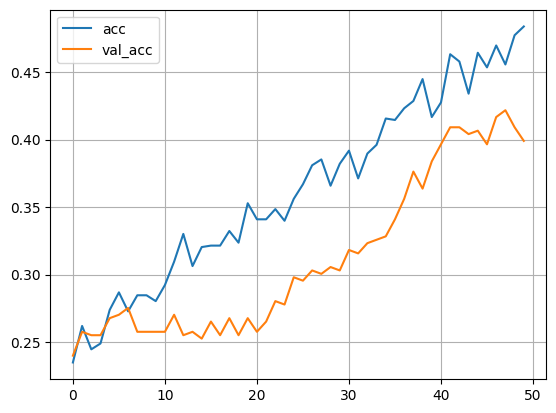

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4174 - loss: 1.1671 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.006 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9658391692202764
r2_score in Simulation Failt  void  for Each Blade :  0.9857984830817114
Error in Simulation Fault for Each Blade :  0.6314889376958144  --- r2_score Fault S ----  0.9737613327943915
Error in Simulation Fault T  for Each Blade :  0.6314889376958144  --- r2_score Fault T :  0.9842852484983403
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9911863065291137
r2_score in Simulation Failt  void  for Each Blade :  0.9850340668817072
Error in Simulation Fault for Each Blade :  -0.4450060077799938  --- r2_score Fault S ----  0.9573200011623683
Error in Simulation Fault T  for Each Blade :  -0.4450060077799938  --- r2_score Fault T :  0.9824938672120571
 ----- for each Blade Simulated ----- 
r2

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
22 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.12      0.18      0.15        65
         1.0       0.29      0.26      0.27       120
         2.0       0.22      0.32      0.26        66
         3.0       0.33      0.22      0.26       145

    accuracy                           0.24       396
   macro avg       0.24      0.25      0.24       396
weighted avg       0.27      0.24      0.25       396

accuracy accuracy_random_forest  : 0.33080808080808083
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - acc: 0.2792 - loss: 1.3899 - val_acc: 0.2677 - val_loss: 1.3843
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2764 - loss: 1.3807 - val_acc: 0.2854 - val_loss: 1.3814
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2973 - loss: 1.3717 - val_acc: 0.2879 - val_loss: 1.3778
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3070 - loss: 1.3626 - val_acc: 0.3106 - val_loss: 1.3741
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3317 - loss: 1.3654 - val_acc: 0.3232 - val_loss: 1.3713
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3226 - loss: 1.3607 - val_acc: 0.3384 - val_loss: 1.3682
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3184 - loss: 1.3632 - val_acc: 0.3409 - val_loss: 1.3650
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3479 - loss: 1.3561 - val_acc: 0.3510 - val_loss: 1.3604
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3546 - loss: 1.3422 - v

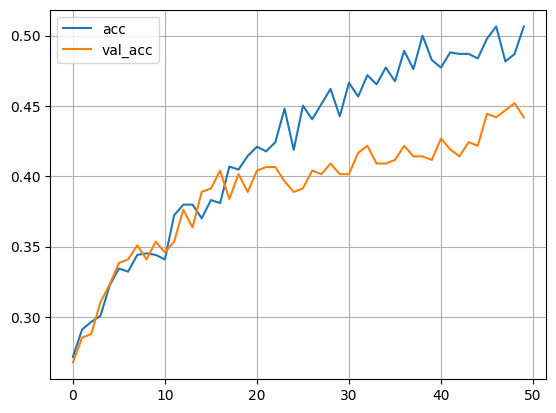

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4935 - loss: 1.0828 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.007 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9802723902593946
r2_score in Simulation Failt  void  for Each Blade :  0.9739989533572838
Error in Simulation Fault for Each Blade :  1.4521639878539094  --- r2_score Fault S ----  0.9785480984529337
Error in Simulation Fault T  for Each Blade :  1.4521639878539094  --- r2_score Fault T :  0.9880892429165075
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.98570017079313
r2_score in Simulation Failt  void  for Each Blade :  0.987706560439815
Error in Simulation Fault for Each Blade :  -1.599340497740338  --- r2_score Fault S ----  0.9802164726651714
Error in Simulation Fault T  for Each Blade :  -1.599340497740338  --- r2_score Fault T :  0.9906416811025316
 ----- for each Blade Simulated ----- 
r2_scor

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.21      0.22      0.21        93
         1.0       0.35      0.26      0.30       140
         2.0       0.14      0.19      0.16        69
         3.0       0.24      0.26      0.25        94

    accuracy                           0.24       396
   macro avg       0.23      0.23      0.23       396
weighted avg       0.25      0.24      0.24       396

accuracy accuracy_random_forest  : 0.3207070707070707
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - acc: 0.2452 - loss: 1.4556 - val_acc: 0.2525 - val_loss: 1.4198
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2851 - loss: 1.4089 - val_acc: 0.2475 - val_loss: 1.4036
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2244 - loss: 1.4072 - val_acc: 0.2626 - val_loss: 1.3965
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2538 - loss: 1.3937 - val_acc: 0.2601 - val_loss: 1.3932
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2763 - loss: 1.3902 - val_acc: 0.2601 - val_loss: 1.3879
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2945 - loss: 1.3729 - val_acc: 0.2702 - val_loss: 1.3854
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2955 - loss: 1.3757 - val_acc: 0.2753 - val_loss: 1.3834
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2654 - loss: 1.3790 - val_acc: 0.2879 - val_loss: 1.3822
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.2721 - loss: 1.3765 - 

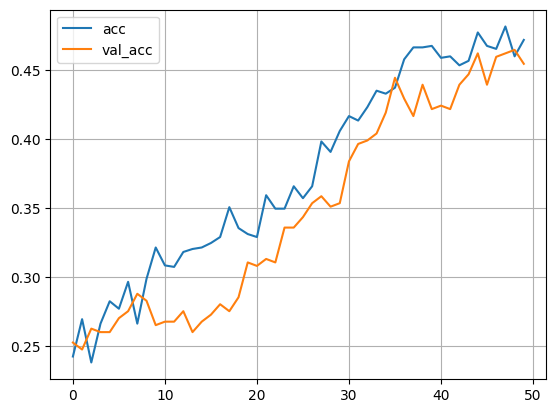

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4515 - loss: 1.0875 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.007 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9696642334983192
r2_score in Simulation Failt  void  for Each Blade :  0.9833780625409186
Error in Simulation Fault for Each Blade :  0.2544949696043828  --- r2_score Fault S ----  0.979132533947626
Error in Simulation Fault T  for Each Blade :  0.2544949696043828  --- r2_score Fault T :  0.9824505289721075
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9871152093653242
r2_score in Simulation Failt  void  for Each Blade :  0.9767199238727562
Error in Simulation Fault for Each Blade :  -0.09769562644291518  --- r2_score Fault S ----  0.9865235285387064
Error in Simulation Fault T  for Each Blade :  -0.09769562644291518  --- r2_score Fault T :  0.9731505529897478
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.21      0.18      0.19       112
         1.0       0.35      0.24      0.28       155
         2.0       0.21      0.28      0.24        72
         3.0       0.17      0.30      0.22        57

    accuracy                           0.24       396
   macro avg       0.23      0.25      0.23       396
weighted avg       0.26      0.24      0.24       396

accuracy accuracy_random_forest  : 0.29292929292929293
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - acc: 0.2295 - loss: 1.5096 - val_acc: 0.2525 - val_loss: 1.4253
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2601 - loss: 1.4220 - val_acc: 0.2449 - val_loss: 1.4040
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2560 - loss: 1.4144 - val_acc: 0.2677 - val_loss: 1.3971
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2863 - loss: 1.3843 - val_acc: 0.2576 - val_loss: 1.3964
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2573 - loss: 1.3921 - val_acc: 0.2222 - val_loss: 1.3956
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2337 - loss: 1.3946 - val_acc: 0.2096 - val_loss: 1.3955
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2985 - loss: 1.3818 - val_acc: 0.2197 - val_loss: 1.3959
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2594 - loss: 1.3898 - val_acc: 0.2222 - val_loss: 1.3942
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3012 - loss: 1.3734 - 

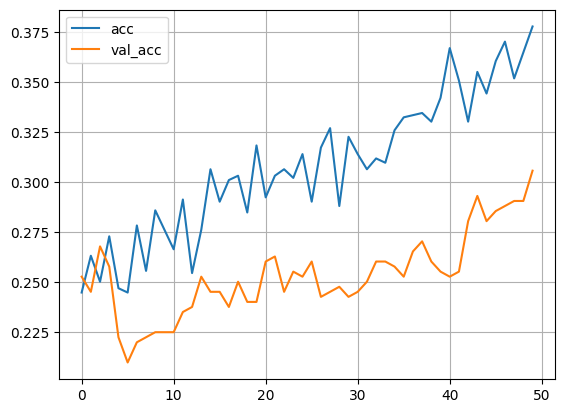

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.2942 - loss: 1.3758 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.007 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9867741069443378
r2_score in Simulation Failt  void  for Each Blade :  0.9670254758999176
Error in Simulation Fault for Each Blade :  -0.07830338952390425  --- r2_score Fault S ----  0.985933297035181
Error in Simulation Fault T  for Each Blade :  -0.07830338952390425  --- r2_score Fault T :  0.988764207199406
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9809262795271982
r2_score in Simulation Failt  void  for Each Blade :  0.959951330792562
Error in Simulation Fault for Each Blade :  0.6718309760370333  --- r2_score Fault S ----  0.9882364321295118
Error in Simulation Fault T  for Each Blade :  0.6718309760370333  --- r2_score Fault T :  0.9763935293259033
 ----- for each Blade Simulated ----- 
r2_

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.22      0.18      0.20       114
         1.0       0.25      0.23      0.24       112
         2.0       0.22      0.24      0.23        87
         3.0       0.18      0.22      0.20        83

    accuracy                           0.22       396
   macro avg       0.22      0.22      0.22       396
weighted avg       0.22      0.22      0.22       396

accuracy accuracy_random_forest  : 0.29545454545454547
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - acc: 0.2622 - loss: 1.4523 - val_acc: 0.2298 - val_loss: 1.4323
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2597 - loss: 1.4178 - val_acc: 0.2273 - val_loss: 1.4236
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2769 - loss: 1.4141 - val_acc: 0.2172 - val_loss: 1.4179
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2928 - loss: 1.3894 - val_acc: 0.2172 - val_loss: 1.4137
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2874 - loss: 1.3863 - val_acc: 0.2121 - val_loss: 1.4109
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2598 - loss: 1.3849 - val_acc: 0.2197 - val_loss: 1.4092
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2519 - loss: 1.3938 - val_acc: 0.2121 - val_loss: 1.4080
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2855 - loss: 1.3841 - val_acc: 0.2020 - val_loss: 1.4067
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2930 - loss: 1.3727 - v

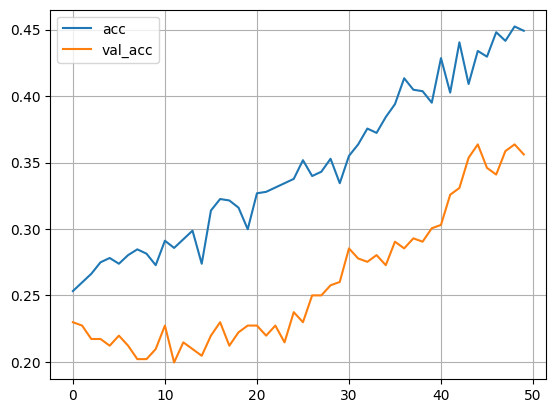

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3544 - loss: 1.2120 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.007 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9693986066716651
r2_score in Simulation Failt  void  for Each Blade :  0.9829480809887181
Error in Simulation Fault for Each Blade :  0.24577709577169604  --- r2_score Fault S ----  0.9828655967965026
Error in Simulation Fault T  for Each Blade :  0.24577709577169604  --- r2_score Fault T :  0.9851022174927797
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9931785928168267
r2_score in Simulation Failt  void  for Each Blade :  0.9915628676752021
Error in Simulation Fault for Each Blade :  0.3440687074111357  --- r2_score Fault S ----  0.9810234276642941
Error in Simulation Fault T  for Each Blade :  0.3440687074111357  --- r2_score Fault T :  0.9882343009068524
 ----- for each Blade Simulated ----- 
r2

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
41 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.23      0.28      0.25        78
         1.0       0.17      0.33      0.22        55
         2.0       0.19      0.25      0.22        72
         3.0       0.43      0.22      0.29       191

    accuracy                           0.25       396
   macro avg       0.25      0.27      0.25       396
weighted avg       0.31      0.25      0.26       396

accuracy accuracy_random_forest  : 0.3005050505050505
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - acc: 0.2348 - loss: 1.4568 - val_acc: 0.2525 - val_loss: 1.4067
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.2658 - loss: 1.4151 - val_acc: 0.2551 - val_loss: 1.3961
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2556 - loss: 1.4015 - val_acc: 0.2323 - val_loss: 1.3912
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2605 - loss: 1.3959 - val_acc: 0.2626 - val_loss: 1.3887
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2834 - loss: 1.3878 - val_acc: 0.2677 - val_loss: 1.3869
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2823 - loss: 1.3754 - val_acc: 0.2727 - val_loss: 1.3848
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2826 - loss: 1.3890 - val_acc: 0.2652 - val_loss: 1.3835
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2735 - loss: 1.3839 - val_acc: 0.2702 - val_loss: 1.3824
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3132 - loss: 1.3645 - v

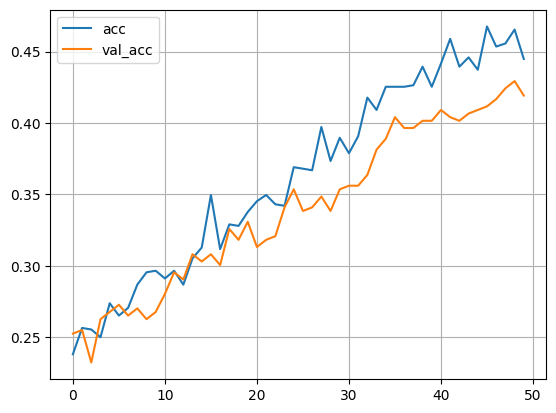

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4133 - loss: 1.1497 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.008 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.98666842625962
r2_score in Simulation Failt  void  for Each Blade :  0.989982407627752
Error in Simulation Fault for Each Blade :  -0.9722577020854617  --- r2_score Fault S ----  0.979277338691534
Error in Simulation Fault T  for Each Blade :  -0.9722577020854617  --- r2_score Fault T :  0.9606957231372837
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9392676125306684
r2_score in Simulation Failt  void  for Each Blade :  0.9663766188078894
Error in Simulation Fault for Each Blade :  0.4378960314430802  --- r2_score Fault S ----  0.9843720610598917
Error in Simulation Fault T  for Each Blade :  0.4378960314430802  --- r2_score Fault T :  0.9901349677813949
 ----- for each Blade Simulated ----- 
r2_sco

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.49      0.26      0.34       183
         1.0       0.11      0.24      0.15        50
         2.0       0.39      0.31      0.35       118
         3.0       0.11      0.24      0.15        45

    accuracy                           0.27       396
   macro avg       0.28      0.27      0.25       396
weighted avg       0.37      0.27      0.30       396

accuracy accuracy_random_forest  : 0.3333333333333333
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - acc: 0.2453 - loss: 1.4665 - val_acc: 0.2551 - val_loss: 1.4265
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2436 - loss: 1.4341 - val_acc: 0.2525 - val_loss: 1.4114
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2535 - loss: 1.4154 - val_acc: 0.2475 - val_loss: 1.4024
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2645 - loss: 1.3936 - val_acc: 0.2702 - val_loss: 1.3987
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2640 - loss: 1.3928 - val_acc: 0.2525 - val_loss: 1.3959
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2365 - loss: 1.3914 - val_acc: 0.2551 - val_loss: 1.3947
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2872 - loss: 1.3797 - val_acc: 0.2475 - val_loss: 1.3943
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2866 - loss: 1.3800 - val_acc: 0.2424 - val_loss: 1.3927
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2811 - loss: 1.3793 - v

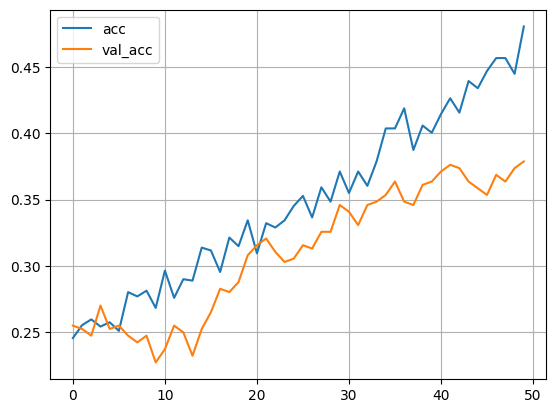

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3933 - loss: 1.1126 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.008 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9647127027881144
r2_score in Simulation Failt  void  for Each Blade :  0.980337813742044
Error in Simulation Fault for Each Blade :  -0.25600120362268086  --- r2_score Fault S ----  0.9616420116607636
Error in Simulation Fault T  for Each Blade :  -0.25600120362268086  --- r2_score Fault T :  0.9911750245736741
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9895670983260946
r2_score in Simulation Failt  void  for Each Blade :  0.9822978967829247
Error in Simulation Fault for Each Blade :  0.8267903128921934  --- r2_score Fault S ----  0.9883199427905426
Error in Simulation Fault T  for Each Blade :  0.8267903128921934  --- r2_score Fault T :  0.9829789707275116
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
16 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.26      0.23      0.24       109
         1.0       0.25      0.29      0.27        89
         2.0       0.24      0.28      0.26        83
         3.0       0.31      0.26      0.28       115

    accuracy                           0.26       396
   macro avg       0.26      0.26      0.26       396
weighted avg       0.27      0.26      0.26       396

accuracy accuracy_random_forest  : 0.3333333333333333
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - acc: 0.2804 - loss: 1.4251 - val_acc: 0.2576 - val_loss: 1.3971
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2246 - loss: 1.3993 - val_acc: 0.2374 - val_loss: 1.3922
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2592 - loss: 1.3896 - val_acc: 0.2727 - val_loss: 1.3908
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.2459 - loss: 1.3997 - val_acc: 0.2677 - val_loss: 1.3900
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2518 - loss: 1.3851 - val_acc: 0.2753 - val_loss: 1.3903
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2702 - loss: 1.3820 - val_acc: 0.2626 - val_loss: 1.3906
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.3015 - loss: 1.3777 - val_acc: 0.2702 - val_loss: 1.3904
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2807 - loss: 1.3768 - val_acc: 0.2525 - val_loss: 1.3920
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2764 - loss: 1.3775 - 

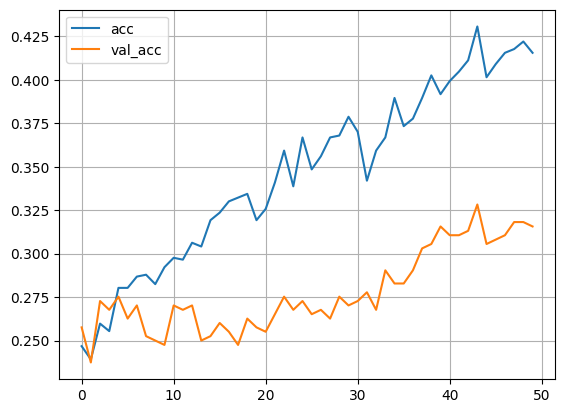

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.3065 - loss: 1.3181 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.008 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9865751589938869
r2_score in Simulation Failt  void  for Each Blade :  0.9825278633892397
Error in Simulation Fault for Each Blade :  0.04797225993931398  --- r2_score Fault S ----  0.9810781435374033
Error in Simulation Fault T  for Each Blade :  0.04797225993931398  --- r2_score Fault T :  0.972713431203341
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.978725893243342
r2_score in Simulation Failt  void  for Each Blade :  0.9861865495627483
Error in Simulation Fault for Each Blade :  -1.4766914934185724  --- r2_score Fault S ----  0.98391681182346
Error in Simulation Fault T  for Each Blade :  -1.4766914934185724  --- r2_score Fault T :  0.9811689532234567
 ----- for each Blade Simulated ----- 
r2_s

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.16      0.18      0.17        90
         1.0       0.12      0.31      0.18        42
         2.0       0.38      0.28      0.32       129
         3.0       0.35      0.25      0.29       135

    accuracy                           0.25       396
   macro avg       0.25      0.25      0.24       396
weighted avg       0.29      0.25      0.26       396

accuracy accuracy_random_forest  : 0.30808080808080807
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - acc: 0.2576 - loss: 1.5179 - val_acc: 0.2399 - val_loss: 1.4458
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.2679 - loss: 1.4400 - val_acc: 0.2551 - val_loss: 1.4040
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2613 - loss: 1.4133 - val_acc: 0.2677 - val_loss: 1.3917
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.2590 - loss: 1.3937 - val_acc: 0.2879 - val_loss: 1.3850
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2804 - loss: 1.3810 - val_acc: 0.2980 - val_loss: 1.3793
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2694 - loss: 1.3908 - val_acc: 0.3030 - val_loss: 1.3741
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2820 - loss: 1.3728 - val_acc: 0.3005 - val_loss: 1.3703
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3231 - loss: 1.3627 - val_acc: 0.3030 - val_loss: 1.3677
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3083 - loss: 1.3632 - v

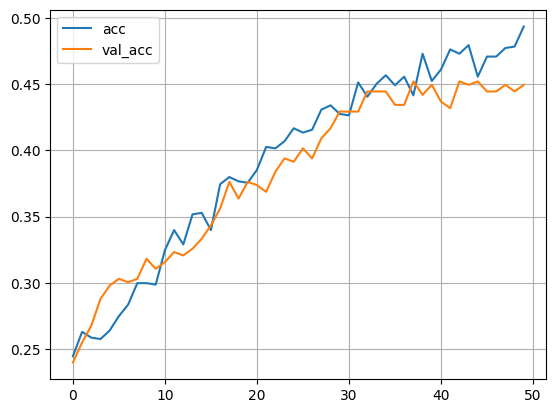

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4726 - loss: 1.0706 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.008 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.971660370345998
r2_score in Simulation Failt  void  for Each Blade :  0.9887235897145933
Error in Simulation Fault for Each Blade :  -0.8458674154578831  --- r2_score Fault S ----  0.9874556994793352
Error in Simulation Fault T  for Each Blade :  -0.8458674154578831  --- r2_score Fault T :  0.9685848470493843
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9778838282315326
r2_score in Simulation Failt  void  for Each Blade :  0.9626685595672966
Error in Simulation Fault for Each Blade :  0.4470682756554438  --- r2_score Fault S ----  0.9692470788122446
Error in Simulation Fault T  for Each Blade :  0.4470682756554438  --- r2_score Fault T :  0.9859376965824621
 ----- for each Blade Simulated ----- 
r2_

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.15      0.22      0.18        68
         1.0       0.22      0.26      0.24        88
         2.0       0.15      0.30      0.20        47
         3.0       0.50      0.25      0.34       193

    accuracy                           0.26       396
   macro avg       0.25      0.26      0.24       396
weighted avg       0.34      0.26      0.27       396

accuracy accuracy_random_forest  : 0.2878787878787879
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - acc: 0.2632 - loss: 1.5005 - val_acc: 0.2677 - val_loss: 1.4185
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - acc: 0.2483 - loss: 1.4141 - val_acc: 0.2626 - val_loss: 1.4033
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2725 - loss: 1.4128 - val_acc: 0.2753 - val_loss: 1.3963
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2965 - loss: 1.3879 - val_acc: 0.2727 - val_loss: 1.3940
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2682 - loss: 1.3847 - val_acc: 0.2828 - val_loss: 1.3926
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2781 - loss: 1.3757 - val_acc: 0.2727 - val_loss: 1.3913
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2870 - loss: 1.3824 - val_acc: 0.2904 - val_loss: 1.3899
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2938 - loss: 1.3748 - val_acc: 0.2828 - val_loss: 1.3910
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2753 - loss: 1.3736 - 

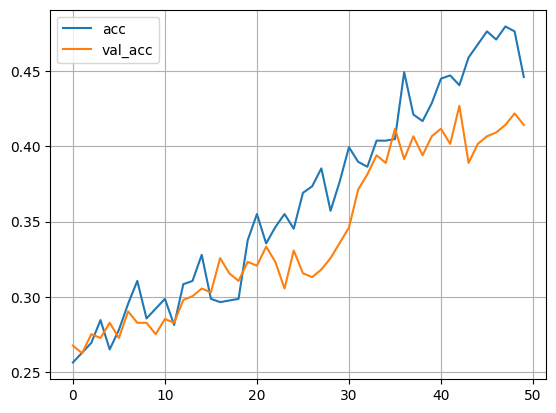

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4363 - loss: 1.1367 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.009 | iter_flat : 1 
r2_score in Simulation Health for Each Blade :  0.9627222781457296
r2_score in Simulation Failt  void  for Each Blade :  0.9909026628018491
Error in Simulation Fault for Each Blade :  -1.6280468170387588  --- r2_score Fault S ----  0.9708189411993947
Error in Simulation Fault T  for Each Blade :  -1.6280468170387588  --- r2_score Fault T :  0.9814506891892022
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9910881291655438
r2_score in Simulation Failt  void  for Each Blade :  0.9936073635572362
Error in Simulation Fault for Each Blade :  1.1529542416018632  --- r2_score Fault S ----  0.9765805254346749
Error in Simulation Fault T  for Each Blade :  1.1529542416018632  --- r2_score Fault T :  0.961003629126309
 ----- for each Blade Simulated ----- 
r2_

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
38 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.27      0.20      0.23       130
         1.0       0.08      0.20      0.12        45
         2.0       0.25      0.24      0.25        99
         3.0       0.29      0.23      0.25       122

    accuracy                           0.22       396
   macro avg       0.22      0.22      0.21       396
weighted avg       0.25      0.22      0.23       396

accuracy accuracy_random_forest  : 0.3005050505050505
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - acc: 0.2530 - loss: 1.5214 - val_acc: 0.2601 - val_loss: 1.3911
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.2486 - loss: 1.4184 - val_acc: 0.2525 - val_loss: 1.3781
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2810 - loss: 1.3983 - val_acc: 0.2904 - val_loss: 1.3751
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2796 - loss: 1.3898 - val_acc: 0.2854 - val_loss: 1.3740
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3075 - loss: 1.3736 - val_acc: 0.2980 - val_loss: 1.3719
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2545 - loss: 1.3770 - val_acc: 0.2854 - val_loss: 1.3708
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2650 - loss: 1.3810 - val_acc: 0.2803 - val_loss: 1.3696
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2795 - loss: 1.3686 - val_acc: 0.2879 - val_loss: 1.3657
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3147 - loss: 1.3651 - v

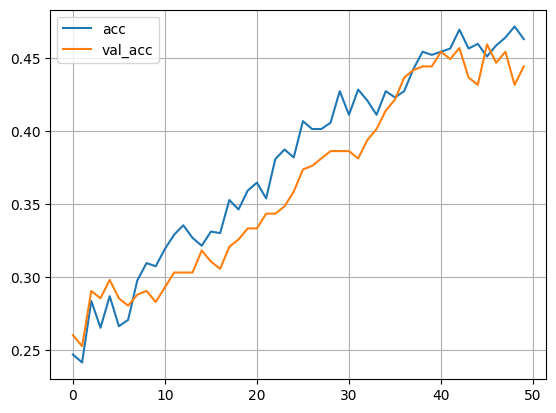

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4386 - loss: 1.0965 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.009 | iter_flat : 2 
r2_score in Simulation Health for Each Blade :  0.9634717112797238
r2_score in Simulation Failt  void  for Each Blade :  0.9717545670264394
Error in Simulation Fault for Each Blade :  -0.2201851401176922  --- r2_score Fault S ----  0.9751273798900808
Error in Simulation Fault T  for Each Blade :  -0.2201851401176922  --- r2_score Fault T :  0.9876867881652281
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.983732302372519
r2_score in Simulation Failt  void  for Each Blade :  0.9905854447440342
Error in Simulation Fault for Each Blade :  0.47874110328111463  --- r2_score Fault S ----  0.9862161554734232
Error in Simulation Fault T  for Each Blade :  0.47874110328111463  --- r2_score Fault T :  0.9631341448833014
 ----- for each Blade Simulated ----- 
r

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.08      0.17      0.11        47
         1.0       0.28      0.23      0.26       128
         2.0       0.39      0.28      0.32       133
         3.0       0.24      0.27      0.26        88

    accuracy                           0.25       396
   macro avg       0.25      0.24      0.24       396
weighted avg       0.29      0.25      0.26       396

accuracy accuracy_random_forest  : 0.3055555555555556
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gam

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - acc: 0.2572 - loss: 1.4488 - val_acc: 0.2449 - val_loss: 1.4067
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.2840 - loss: 1.4104 - val_acc: 0.2449 - val_loss: 1.3994
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2588 - loss: 1.3976 - val_acc: 0.2677 - val_loss: 1.3952
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2671 - loss: 1.3929 - val_acc: 0.2601 - val_loss: 1.3924
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2465 - loss: 1.3876 - val_acc: 0.2626 - val_loss: 1.3899
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2723 - loss: 1.3900 - val_acc: 0.2601 - val_loss: 1.3889
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2986 - loss: 1.3829 - val_acc: 0.2500 - val_loss: 1.3877
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2911 - loss: 1.3821 - val_acc: 0.2626 - val_loss: 1.3861
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.3171 - loss: 1.3741 - 

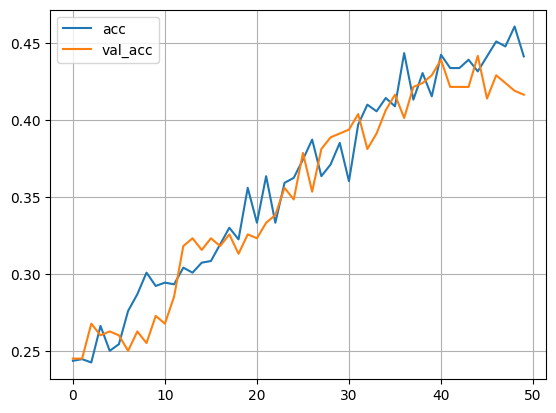

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.4014 - loss: 1.1078 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.009 | iter_flat : 3 
r2_score in Simulation Health for Each Blade :  0.9816866391018337
r2_score in Simulation Failt  void  for Each Blade :  0.9656746203179423
Error in Simulation Fault for Each Blade :  -1.2985383348451007  --- r2_score Fault S ----  0.9896969532318253
Error in Simulation Fault T  for Each Blade :  -1.2985383348451007  --- r2_score Fault T :  0.9722603715036283
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9655558706614976
r2_score in Simulation Failt  void  for Each Blade :  0.9762197258178278
Error in Simulation Fault for Each Blade :  -0.37737917488124983  --- r2_score Fault S ----  0.9787245610490438
Error in Simulation Fault T  for Each Blade :  -0.37737917488124983  --- r2_score Fault T :  0.9744313570270898
 ----- for each Blade Simulated -----

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
33 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.21      0.19      0.20       103
         1.0       0.38      0.28      0.32       143
         2.0       0.22      0.27      0.24        79
         3.0       0.22      0.31      0.26        71

    accuracy                           0.26       396
   macro avg       0.26      0.26      0.26       396
weighted avg       0.27      0.26      0.26       396

accuracy accuracy_random_forest  : 0.37373737373737376
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - acc: 0.2394 - loss: 1.6131 - val_acc: 0.2601 - val_loss: 1.4430
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2617 - loss: 1.4436 - val_acc: 0.2551 - val_loss: 1.4142
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.2447 - loss: 1.4056 - val_acc: 0.2576 - val_loss: 1.4029
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2607 - loss: 1.4053 - val_acc: 0.2551 - val_loss: 1.3935
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2491 - loss: 1.4095 - val_acc: 0.2551 - val_loss: 1.3861
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2720 - loss: 1.3878 - val_acc: 0.2677 - val_loss: 1.3802
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.3005 - loss: 1.3780 - val_acc: 0.2778 - val_loss: 1.3760
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2941 - loss: 1.3788 - val_acc: 0.2753 - val_loss: 1.3714
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2685 - loss: 1.3742 - v

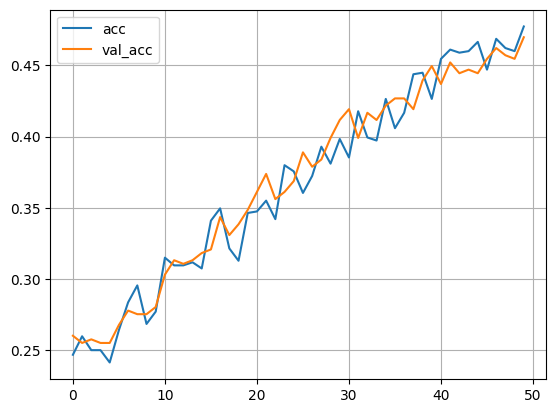

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.4623 - loss: 1.1309 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 
iter_alpha : 0.009 | iter_flat : 4 
r2_score in Simulation Health for Each Blade :  0.9933853542880166
r2_score in Simulation Failt  void  for Each Blade :  0.9473104553820745
Error in Simulation Fault for Each Blade :  -0.4007239724040703  --- r2_score Fault S ----  0.9795294481804819
Error in Simulation Fault T  for Each Blade :  -0.4007239724040703  --- r2_score Fault T :  0.9793576539929371
 ----- for each Blade Simulated ----- 
r2_score in Simulation Health for Each Blade :  0.9371711982362394
r2_score in Simulation Failt  void  for Each Blade :  0.9752951551412019
Error in Simulation Fault for Each Blade :  0.9006021467634939  --- r2_score Fault S ----  0.9781643511633457
Error in Simulation Fault T  for Each Blade :  0.9006021467634939  --- r2_score Fault T :  0.961617852027933
 ----- for each Blade Simulated ----- 
r2_

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
28 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

              precision    recall  f1-score   support

         0.0       0.35      0.26      0.30       130
         1.0       0.15      0.29      0.20        55
         2.0       0.24      0.22      0.23       105
         3.0       0.26      0.24      0.25       106

    accuracy                           0.25       396
   macro avg       0.25      0.25      0.24       396
weighted avg       0.27      0.25      0.25       396

accuracy accuracy_random_forest  : 0.32575757575757575
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, ga

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - acc: 0.2589 - loss: 1.4392 - val_acc: 0.2247 - val_loss: 1.4246
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - acc: 0.2748 - loss: 1.4077 - val_acc: 0.2601 - val_loss: 1.4144
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2532 - loss: 1.3888 - val_acc: 0.2500 - val_loss: 1.4069
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2883 - loss: 1.3821 - val_acc: 0.2399 - val_loss: 1.4028
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.2830 - loss: 1.3803 - val_acc: 0.2652 - val_loss: 1.3989
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2844 - loss: 1.3626 - val_acc: 0.2803 - val_loss: 1.3973
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.2884 - loss: 1.3798 - val_acc: 0.2778 - val_loss: 1.3947
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.2945 - loss: 1.3744 - val_acc: 0.3106 - val_loss: 1.3895
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.3251 - loss: 1.3648 - v

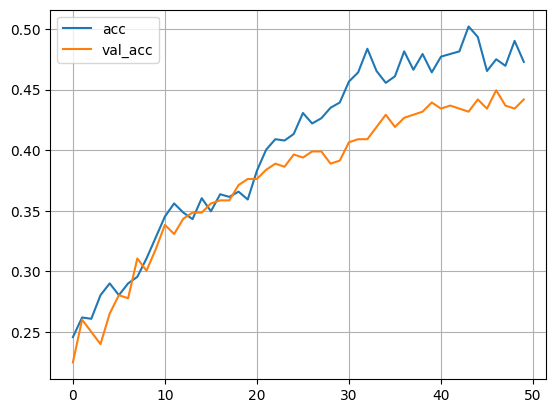

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - acc: 0.4515 - loss: 1.0651 
 ----------------- //////// End This Iter alpha and Flap //////// ------------------------- 


In [8]:
for iter_alpha in total_alpha_content :
  for iter_flat in total_flat_content :
    print(f"iter_alpha : {iter_alpha} | iter_flat : {iter_flat} ")
    params_health   = []
    params_fault    = []
    params_fault_t  = []
    params_health_t = []
    for iter_link in total_file_link :
      df_table_change     = pd.read_csv(iter_link)
      for locate in total_location:
        related_x = -1
        related_y = -1
        related_z = -1
        for iteration in range(10):
          alpha = 0
          term  = 0
          Flat_Add = 0
          noise_activate = ( (np.random.randn() + 1 ) / 100 )
          #print( f'Alpha : {iter_alpha} ' ,  f'Table Change : {iter_link}' , ' -- ' , f'Locate : {locate} ' , ' -- ' , f"Iter : {iteration}" , ' -- ' , '')
          select_location_combin_flap_term = 0
          select_locatiom_flap = 0

          total_health_iter  = []
          total_health_iter_t = []
          total_fault_iter   = []
          total_fault_t_iter = []
          new_data_simulated_ = []
          new_data_simulated_fault = []
          new_data_simulated_fault_t = []
          new_data_simulated_health_t = []



          for i in range(df_table_change.shape[0]):
            x_mean = df_table_change.iloc[i, 1]
            x_std  = df_table_change.iloc[i, 2]
            y_mean = df_table_change.iloc[i, 3]
            y_std  = df_table_change.iloc[i, 4]
            z_mean = df_table_change.iloc[i, 5]
            z_std  = df_table_change.iloc[i, 6]

            if i > locate :
              alpha = iter_alpha
              term  = -1 * ( alpha * abs( i - locate ) + noise_activate )
              Flat_Add  = iter_flat / 10

            for element in total_points[i * 3: (i + 1) * 3, :]:
              x_sample = element[0]
              y_sample = element[1]
              z_sample = element[2]
              rng = np.random.default_rng()
              x_added  = rng.normal(x_mean, x_std, size=1)
              x_added  = x_added.tolist()[0]
              x_sample += related_x * x_added

              y_added  = rng.normal(y_mean, y_std, size=1)
              y_added  = y_added.tolist()[0]
              y_sample += related_y * y_added

              z_added  = rng.normal(z_mean, z_std, size=1)
              z_base   = z_sample

              z_added_term  = z_added.tolist()[0] + term
              z_added       = z_added.tolist()[0]
              z_sample_new_term = z_base + related_z * z_added_term
              z_sample_new      = z_base + related_z * z_added
              z_flat  = z_sample_new_term
              z_flap_health = z_sample_new


              if select_location_combin_flap_term  == 0 :
                if np.random.randint(0 ,2 ) :
                  z_flat = z_sample_new_term + Flat_Add


              if select_locatiom_flap == 0 :
                if np.random.randint(0 ,2 ) :
                  z_flap_health = z_sample_new + Flat_Add







              new_data_simulated_.append([ x_sample, y_sample, z_sample_new  ])
              new_data_simulated_fault.append([ x_sample, y_sample, z_sample_new_term  ])
              new_data_simulated_fault_t.append([ x_sample, y_sample, z_flat  ])
              new_data_simulated_health_t.append([x_sample , y_sample , z_flap_health ])

              total_health_iter.append([ x_sample, y_sample, z_sample_new  ])
              total_fault_iter.append([ x_sample, y_sample, z_sample_new_term  ])
              total_fault_t_iter.append([ x_sample, y_sample, z_flat  ])
              total_health_iter_t.append([x_sample , y_sample , z_flap_health ])



          # fig = plt.figure(figsize=(20 , 10 ))

          # ax0 = fig.add_subplot(1 , 6 , 1 , projection='3d' )
          # ax1 = fig.add_subplot(1 , 6 , 2 , projection='3d' )
          # ax2 = fig.add_subplot(1 , 6 , 3 , projection='3d' )
          # ax3 = fig.add_subplot(1 , 6 , 4 , projection='3d' )
          # ax4 = fig.add_subplot(1 , 6 , 5 , projection='3d' )
          # ax5 = fig.add_subplot(1 , 6 , 6 , projection='3d' )

          # ax6 = fig.add_subplot(3 , 6 , 1 )
          # ax7 = fig.add_subplot(3 , 6 , 2 )
          # ax8 = fig.add_subplot(3 , 6 , 3 )

          # # ax3 = fig.add_subplot(1 , 6 , 4 )
          # # ax4 = fig.add_subplot(1 , 6 , 5 )
          # # ax5 = fig.add_subplot(1 , 6 , 6 )






          # total_health_iter = np.array(total_health_iter)
          # total_health_iter = np.array(total_health_iter)
          # total_fault_iter = np.array(total_fault_iter)
          # total_fault_t_iter = np.array(total_fault_t_iter)
          # total_health_iter_t = np.array(total_health_iter_t)
          # print(f"iter_alpha : {iter_alpha} , flap: {iter_flat} , locate : {locate} ,  iteration : {iteration} ")

          # ax0.scatter3D(total_health_iter[: , 0 ] , total_health_iter[: , 1 ] , total_health_iter[: , 2 ]  , label='health' , c = 'r'   )
          # ax0.scatter3D(total_fault_iter[: , 0 ] , total_fault_iter[: , 1 ] , total_fault_iter[: , 2 ]  , label='fault_alpha' ,  c = 'b' )
          # ax1.scatter3D(total_fault_iter[: , 0 ] , total_fault_iter[: , 1 ] , total_fault_iter[: , 2 ]  ,       label='fault_alpha' , c ='blue', s = 30     )
          # ax1.scatter3D(total_fault_t_iter[: , 0 ] , total_fault_t_iter[: , 1 ] , total_fault_t_iter[: , 2 ]  , label='fault_alpha + void ' , c='red' , s = 30 )
          # ax2.scatter3D(total_fault_t_iter[: , 0 ] , total_fault_t_iter[: , 1 ] , total_fault_t_iter[: , 2 ]  , label='fault_alpha + void ' , c='red'  , s = 30  )

          # ax3.scatter3D(total_health_iter[: , 0 ] , total_health_iter[: , 1 ]  , total_health_iter[: , 2 ]  ,       label='fault_void' , c ='blue'  )
          # ax3.scatter3D(total_fault_iter[: , 0 ] , total_fault_iter[: , 1]  , total_fault_iter[: , 2 ]  ,       label='fault_alpha' , c ='red' )
          # ax3.set_xlabel("axis x ")
          # ax3.set_ylabel("axis y ")

          # ax4.scatter3D(total_health_iter[: , 0 ] , total_health_iter[: , 1 ]  , total_health_iter[: , 2 ]  ,       label='health' , c ='blue',  )
          # ax4.scatter3D(total_fault_t_iter[: , 0 ] , total_health_iter[: , 1 ]  , total_fault_t_iter[: , 2 ]  , label='fault_alpha+ void ' , c='red' ,  )
          # ax4.set_xlabel("axis x")
          # ax4.set_ylabel("axis y")

          # ax5.scatter3D(total_health_iter[: , 0 ]  , total_health_iter[: , 1 ] , total_fault_iter[: , 2 ]  ,       label='health' , c ='blue' ,  )
          # ax5.scatter3D(total_health_iter_t[: , 0 ] , total_health_iter_t[: , 1] , total_fault_t_iter[: , 2 ]  , label='fault_void' , c='red' ,  )
          # ax5.set_xlabel("axis x ")
          # ax5.set_ylabel("axis y ")

          # ax6.scatter(total_health_iter[: , 0 ]  , total_health_iter[: , 2 ]  , label='health' , c='b' , s = 40 ,  )
          # ax6.scatter(total_health_iter_t[: , 0 ]  , total_fault_iter[: , 2 ]  , label='fault_void' , c='r' , s = 30 ,  )
          # ax6.set_xlabel("axis  x ")
          # ax6.set_ylabel("axis  y ")
          # ax6.set_title(f"alpha : {iter_alpha} , void : {iter_flat/10} , location : {locate}")

          # ax7.scatter(total_health_iter[: , 0 ]  , total_health_iter[: , 2 ]  , label='health' , c='b' , s = 40 , alpha = 0.5 )
          # ax7.scatter(total_fault_t_iter[: , 0 ]  , total_fault_t_iter[: , 2 ]  , label='fault_alpha + void ' , c='r' , s = 30  )
          # ax7.set_xlabel("axis  x ")
          # ax7.set_ylabel("axis  y ")

          # ax8.scatter(total_fault_iter[: , 0 ]  , total_fault_iter[: , 2 ]  , label='fault_alpha' , c='b' , )
          # ax8.scatter(total_fault_t_iter[: , 0 ]  , total_fault_t_iter[: , 2 ]  , label='Fault_alpha + void' , c='r')
          # ax8.set_xlabel("axis  x ")
          # ax8.set_ylabel("axis  y ")


          # ax0.legend()
          # ax0.grid()
          # ax0
          # ax1.legend()
          # ax1.grid()
          # ax2.legend()
          # ax2.grid()
          # ax3.legend()
          # ax3.grid()

          # ax4.legend()
          # ax4.grid()
          # ax5.legend()
          # ax5.grid()


          # ax6.legend()
          # ax6.grid()

          # ax7.legend()
          # ax7.grid()
          # ax8.legend()
          # ax8.grid()

          # plt.show()




          new_data_simulated_         = np.array(new_data_simulated_)
          new_data_simulated_fault    = np.array(new_data_simulated_fault)
          new_data_simulated_fault_t  = np.array(new_data_simulated_fault_t)
          new_data_simulated_health_t = np.array(new_data_simulated_health_t)


          #fig = plt.figure(figsize=(30, 10))
          df_health = pd.DataFrame()
          df_health['X_'] = new_data_simulated_[:, 0]
          df_health['Y_'] = new_data_simulated_[:, 1]
          df_health['Z_'] = new_data_simulated_[:, 2]

          poly = PolynomialFeatures(degree=2)
          x_poly = poly.fit_transform(df_health[['X_', 'Y_']])
          scaler = StandardScaler()
          df_stander = pd.DataFrame(scaler.fit_transform(x_poly), columns=['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2', ])
          df_stander['Z_'] = df_health['Z_']
          x_train, x_test, z_train, z_test = train_test_split(df_stander[['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2']],
                                                                          df_stander["Z_"])
          model = LinearRegression()
          model.fit(x_train, z_train)
          z_predict = model.predict(x_test)
          intercept_0 = model.intercept_
          coef1 = model.coef_[0]
          coef2 = model.coef_[1]
          coef3 = model.coef_[2]
          coef4 = model.coef_[3]
          coef5 = model.coef_[4]
          coef6 = model.coef_[5]

          total_new_generate = []
          total_error_health = 0
          for i in range(len(df_health['X_'])):
            new_value = intercept_0 + coef1 * df_stander.iloc[i, 0] + coef2 * df_stander.iloc[i, 1] + coef3 * df_stander.iloc[i, 2] + coef4 * df_stander.iloc[i, 3] + coef5 * df_stander.iloc[i, 4]
            + coef6 * df_stander.iloc[i, 5]
            total_new_generate.append(new_value)
            error = df_stander.iloc[i, -1] - new_value
            total_error_health += error

          print("r2_score in Simulation Health for Each Blade : " , r2_score(z_predict, z_test) )

          #class health == 0
          params_health.append([intercept_0, coef1, coef2, coef3, coef4, coef5, coef6, r2_score(z_predict, z_test),locate , 0 , iter_alpha ,  iter_flat  ])
          total_change = [1, 1]
          related_x *= total_change[np.random.randint(0, 2)]
          related_y *= total_change[np.random.randint(0, 2)]
          related_z *= total_change[np.random.randint(0, 2)]

          # ---- setup for class health t ----

          df_health_t = pd.DataFrame()
          df_health_t['X_'] = new_data_simulated_health_t[:, 0]
          df_health_t['Y_'] = new_data_simulated_health_t[:, 1]
          df_health_t['Z_'] = new_data_simulated_health_t[:, 2]

          poly_health_t = PolynomialFeatures(degree=2)
          x_poly_health_t = poly_health_t.fit_transform(df_health_t[['X_', 'Y_']])
          scaler_health_t = StandardScaler()
          df_stander_health_t = pd.DataFrame(scaler_health_t.fit_transform(x_poly_health_t), columns=['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2', ])
          df_stander_health_t['Z_'] = df_health_t['Z_']
          x_train, x_test, z_train, z_test = train_test_split(df_stander_health_t[['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2']],
                                                                          df_stander["Z_"])
          model_health_t = LinearRegression()
          model_health_t.fit(x_train, z_train)
          z_predict_health_t = model_health_t.predict(x_test)
          intercept_0 = model_health_t.intercept_
          coef1 = model_health_t.coef_[0]
          coef2 = model_health_t.coef_[1]
          coef3 = model_health_t.coef_[2]
          coef4 = model_health_t.coef_[3]
          coef5 = model_health_t.coef_[4]
          coef6 = model_health_t.coef_[5]

          total_new_generate_health_t = []
          total_error_health_t = 0
          for i in range(len(df_health['X_'])):
            new_value = intercept_0 + coef1 * df_stander_health_t.iloc[i, 0] + coef2 * df_stander_health_t.iloc[i, 1] + coef3 * df_stander_health_t.iloc[i, 2] + coef4 * df_stander_health_t.iloc[i, 3] + coef5 * df_stander_health_t.iloc[i, 4]
            + coef6 * df_stander_health_t.iloc[i, 5]
            total_new_generate_health_t.append(new_value)
            error = df_stander_health_t.iloc[i, -1] - new_value
            total_error_health_t += error

          print("r2_score in Simulation Failt  void  for Each Blade : " , r2_score(z_predict_health_t, z_test) )

          #class health == 0
          params_health_t.append([intercept_0, coef1, coef2, coef3, coef4, coef5, coef6, r2_score(z_predict_health_t, z_test),locate , 1 , iter_alpha ,  iter_flat  ])
          total_change = [1, 1]
          related_x *= total_change[np.random.randint(0, 2)]
          related_y *= total_change[np.random.randint(0, 2)]
          related_z *= total_change[np.random.randint(0, 2)]





          # ---- setup for class Fault ----
          df_fault = pd.DataFrame()
          df_fault['X_'] = new_data_simulated_fault[:, 0]
          df_fault['Y_'] = new_data_simulated_fault[:, 1]
          df_fault['Z_'] = new_data_simulated_fault[:, 2]




          poly_fault = PolynomialFeatures(degree=2)
          x_poly_fault = poly_fault.fit_transform(df_fault[['X_', 'Y_']])
          scaler_fault = StandardScaler()
          df_stander_fault = pd.DataFrame(scaler_fault.fit_transform(x_poly_fault), columns=['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2', ])
          df_stander_fault['Z_'] = df_fault['Z_']
          x_train_fault , x_test_fault , z_train_fault , z_test_fault = train_test_split(df_stander_fault[['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2']], df_stander_fault["Z_"])
          model_fault = LinearRegression()
          model_fault.fit(x_train_fault, z_train_fault)
          z_predict_fault = model_fault.predict(x_test_fault)
          intercept_0 = model_fault.intercept_
          coef1 = model_fault.coef_[0]
          coef2 = model_fault.coef_[1]
          coef3 = model_fault.coef_[2]
          coef4 = model_fault.coef_[3]
          coef5 = model_fault.coef_[4]
          coef6 = model_fault.coef_[5]
          total_new_generate_fault = []
          total_error_fault = 0
          for i in range(len(df_fault['X_'])):
            new_value = intercept_0 + coef1 * df_stander_fault.iloc[i, 0] + coef2 * df_stander_fault.iloc[i, 1] + coef3 *  df_stander_fault.iloc[i, 2] + coef4 * df_stander_fault.iloc[i, 3] + coef5 * df_stander_fault.iloc[i, 4]  + coef6 * df_stander_fault.iloc[i, 5]
            total_new_generate_fault.append(new_value)
            error_Fault = df_stander_fault.iloc[i, -1] - new_value
            total_error_fault += error_Fault

          print("Error in Simulation Fault for Each Blade : " , total_error_fault  , " --- r2_score Fault S ---- " ,  r2_score(z_predict_fault, z_test_fault))


          params_fault.append([intercept_0, coef1, coef2, coef3, coef4, coef5, coef6, r2_score(z_predict_fault, z_test_fault),locate ,  2 , iter_alpha ,  iter_flat ])
          total_change = [1, 1]
          related_x *= total_change[np.random.randint(0, 2)]
          related_y *= total_change[np.random.randint(0, 2)]
          related_z *= total_change[np.random.randint(0, 2)]

          # ---- setup for class Fault T ----

          df_fault_t = pd.DataFrame()
          df_fault_t['X_'] = new_data_simulated_fault_t[:, 0]
          df_fault_t['Y_'] = new_data_simulated_fault_t[:, 1]
          df_fault_t['Z_'] = new_data_simulated_fault_t[:, 2]




          poly_fault_t = PolynomialFeatures(degree=2)
          x_poly_fault_t = poly_fault_t.fit_transform(df_fault_t[['X_', 'Y_']])
          scaler_fault_t = StandardScaler()
          df_stander_fault_t = pd.DataFrame(scaler_fault_t.fit_transform(x_poly_fault_t), columns=['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2', ])
          df_stander_fault_t['Z_'] = df_fault_t['Z_']
          x_train_fault_t , x_test_fault_t , z_train_fault_t , z_test_fault_t = train_test_split(df_stander_fault_t[['0', 'X', 'Y', 'x1^2', 'x1x2', 'x2^2']], df_stander_fault["Z_"])
          model_fault_t = LinearRegression()
          model_fault_t.fit(x_train_fault_t, z_train_fault_t)
          z_predict_fault_t = model_fault_t.predict(x_test_fault_t)
          intercept_0 = model_fault_t.intercept_
          coef1 = model_fault_t.coef_[0]
          coef2 = model_fault_t.coef_[1]
          coef3 = model_fault_t.coef_[2]
          coef4 = model_fault_t.coef_[3]
          coef5 = model_fault_t.coef_[4]
          coef6 = model_fault_t.coef_[5]
          total_new_generate_fault_t = []
          total_error_fault_t = 0
          for i in range(len(df_fault['X_'])):
            new_value = intercept_0 + coef1 * df_stander_fault_t.iloc[i, 0] + coef2 * df_stander_fault_t.iloc[i, 1] + coef3 *  df_stander_fault_t.iloc[i, 2] + coef4 * df_stander_fault_t.iloc[i, 3] + coef5 * df_stander_fault_t.iloc[i, 4]  + coef6 * df_stander_fault_t.iloc[i, 5]
            total_new_generate_fault_t.append(new_value)
            error_Fault = df_stander_fault_t.iloc[i, -1] - new_value
            total_error_fault_t += error_Fault

          print("Error in Simulation Fault T  for Each Blade : " , total_error_fault , " --- r2_score Fault T : " ,  r2_score(z_predict_fault_t, z_test_fault_t)   )



          params_fault_t.append([intercept_0, coef1, coef2, coef3, coef4, coef5, coef6, r2_score(z_predict_fault_t, z_test_fault_t),locate ,  3 , iter_alpha ,  iter_flat ])
          total_change = [1, 1]
          related_x *= total_change[np.random.randint(0, 2)]
          related_y *= total_change[np.random.randint(0, 2)]
          related_z *= total_change[np.random.randint(0, 2)]

          print(" ----- for each Blade Simulated ----- " )



#----
    params_health = np.array(params_health)
    df_params = pd.DataFrame({'bias':params_health[: , 0 ] , 'betha_0':params_health[ : , 1 ] , 'betha_1':params_health[ : , 2 ] , 'betha_2':params_health[ : , 3 ] ,  'betha_3':params_health[ : , 4 ] , 'betha_4':params_health[ : , 5 ] , 'betha_5':params_health[ : , 6 ] , 'R2' : params_health[ : , 7 ]  ,
                          'locate' : params_health[: , 8 ].astype(int)   , 'class' :params_health[: , 9 ] ,
                              'alpha' :params_health[: , 10 ] , 'flap' : params_health[: , 11 ] } )





    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_bias'].append(df_params['bias'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_bias'].append(df_params['bias'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_0'].append(df_params['betha_0'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_0'].append(df_params['betha_0'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_1'].append(df_params['betha_1'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_1'].append(df_params['betha_1'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_2'].append(df_params['betha_2'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_2'].append(df_params['betha_2'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_3'].append(df_params['betha_3'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_3'].append(df_params['betha_3'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_4'].append(df_params['betha_4'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_4'].append(df_params['betha_4'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['mean_betha_5'].append(df_params['betha_5'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH['std_betha_5'].append(df_params['betha_5'].std())

    # -------------------------------------------------------------------------------------------

    params_health_t = np.array(params_health_t)
    df_params_health_t = pd.DataFrame({'bias':params_health_t[: , 0 ] , 'betha_0':params_health_t[ : , 1 ] , 'betha_1':params_health_t[ : , 2 ] , 'betha_2':params_health_t[ : , 3 ] ,  'betha_3':params_health_t[ : , 4 ] , 'betha_4':params_health_t[ : , 5 ] , 'betha_5':params_health[ : , 6 ] , 'R2' : params_health_t[ : , 7 ]  ,
                          'locate' : params_health_t[: , 8 ].astype(int)   , 'class' :params_health_t[: , 9 ] ,
                              'alpha' :params_health_t[: , 10 ] , 'flap' : params_health_t[: , 11 ] } )





    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_bias'].append(df_params_health_t['bias'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_bias'].append(df_params_health_t['bias'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_0'].append(df_params_health_t['betha_0'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_0'].append(df_params_health_t['betha_0'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_1'].append(df_params_health_t['betha_1'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_1'].append(df_params_health_t['betha_1'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_2'].append(df_params_health_t['betha_2'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_2'].append(df_params_health_t['betha_2'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_3'].append(df_params_health_t['betha_3'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_3'].append(df_params_health_t['betha_3'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_4'].append(df_params_health_t['betha_4'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_4'].append(df_params_health_t['betha_4'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['mean_betha_5'].append(df_params_health_t['betha_5'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T['std_betha_5'].append(df_params_health_t['betha_5'].std())





    # --------------------------------------------------------------------------------------------
    params_fault = np.array(params_fault)
    df_params_fault = pd.DataFrame({'bias':params_fault[: , 0 ] , 'betha_0':params_fault[ : , 1 ] , 'betha_1':params_fault[ : , 2 ] , 'betha_2':params_fault[ : , 3 ] ,  'betha_3':params_fault[ : , 4 ] , 'betha_4':params_fault[ : , 5 ] , 'betha_5':params_fault[ : , 6 ] , 'R2' : params_fault[ : , 7 ]  ,
                            'locate' : params_fault[: , 8 ].astype(int) ,
                                    'class' :params_fault[: , 9 ]  ,
                                    'alpha' :params_fault[: , 10 ] , 'flap' : params_fault[: , 11 ] }   )


    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_bias'].append(df_params_fault['bias'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_bias'].append(df_params_fault['bias'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_0'].append(df_params_fault['betha_0'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_0'].append(df_params_fault['betha_0'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_1'].append(df_params_fault['betha_1'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_1'].append(df_params_fault['betha_1'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_2'].append(df_params_fault['betha_2'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_2'].append(df_params_fault['betha_2'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_3'].append(df_params_fault['betha_3'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_3'].append(df_params_fault['betha_3'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_4'].append(df_params_fault['betha_4'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_4'].append(df_params_fault['betha_4'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['mean_betha_5'].append(df_params_fault['betha_5'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT['std_betha_5'].append(df_params_fault['betha_5'].std())




    params_fault_t = np.array(params_fault_t)
    df_params_fault_t = pd.DataFrame({'bias':params_fault_t[: , 0 ] , 'betha_0':params_fault_t[ : , 1 ] , 'betha_1':params_fault_t[ : , 2 ] , 'betha_2':params_fault_t[ : , 3 ] ,  'betha_3':params_fault_t[ : , 4 ] , 'betha_4':params_fault_t[ : , 5 ] , 'betha_5':params_fault_t[ : , 6 ] , 'R2' : params_fault_t[ : , 7 ]  ,
                            'locate' : params_fault_t[: , 8 ].astype(int) ,
                                    'class' :params_fault_t[: , 9 ]  ,
                                    'alpha' :params_fault_t[: , 10 ] , 'flap' : params_fault_t[: , 11 ] }  )


    # check_columns = ['bias' , 'betha_0' , 'betha_1' , 'betha_2' , 'betha_3' , 'betha_4' , 'betha_5' ]
    # for element in check_columns :
    #   fig = plt.figure(figsize = (10 , 10 ))
    #   ax0 = fig.add_subplot(111 )
    #   sns.kdeplot( df_params[element]  , label=f'mean_health - {element} coef'  , shade=True )
    #   sns.kdeplot(df_params_fault[element] , label=f'mean_fault_alpha - {element} coef '  , shade=True  )
    #   sns.kdeplot(df_params_fault_t[element] , label=f'mean_fault-alpha + void- {element} coef ' ,  shade=True  )
    #   sns.kdeplot(df_params_health_t[element] , label=f'mean_fault-void- {element} coef ' ,  shade=True  )
    #   plt.legend()
    #   plt.title(f"For This  alpha : {iter_alpha} and void : {iter_flat / 10 }  ")
    #   plt.grid()
    #   plt.show()



    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_bias'].append(df_params_fault_t['bias'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_bias'].append(df_params_fault_t['bias'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_0'].append(df_params_fault_t['betha_0'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_0'].append(df_params_fault_t['betha_0'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_1'].append(df_params_fault_t['betha_1'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_1'].append(df_params_fault_t['betha_1'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_2'].append(df_params_fault_t['betha_2'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_2'].append(df_params_fault_t['betha_2'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_3'].append(df_params_fault_t['betha_3'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_3'].append(df_params_fault_t['betha_3'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_4'].append(df_params_fault_t['betha_4'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_4'].append(df_params_fault_t['betha_4'].std())

    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['mean_betha_5'].append(df_params_fault_t['betha_5'].mean())
    MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T['std_betha_5'].append(df_params_fault_t['betha_5'].std())



    concat_2_df_health_fault = pd.concat([df_params , df_params_health_t , df_params_fault , df_params_fault_t ] , axis = 0 )
    df_corr = concat_2_df_health_fault.corr()







  # --- learning
    #plt.figure(figsize= (10 , 10 ) )
    #ax = sns.heatmap(df_corr , annot=True )
    #print(df_corr)
    #plt.show()
    total_simulation['alpha'].append(iter_alpha)
    total_simulation['flap'].append(iter_flat)
    total_simulation['bias_correlation'].append(df_corr['class']['bias'])
    total_simulation['betha_0_correlation'].append(df_corr['class']['betha_0'])
    total_simulation['betha_1_correlation'].append(df_corr['class']['betha_1'])
    total_simulation['betha_2_correlation'].append(df_corr['class']['betha_2'])
    total_simulation['betha_3_correlation'].append(df_corr['class']['betha_3'])
    total_simulation['betha_4_correlation'].append(df_corr['class']['betha_4'])
    total_simulation['betha_5_correlation'].append(df_corr['class']['betha_5'])



    #df2_health  =  concat_2_df_health_fault[concat_2_df_health_fault['class'] == 0 ]
    #df2_fault   =  concat_2_df_health_fault[concat_2_df_health_fault['class'] == 1 ]
    #df2_fault_t =  concat_2_df_health_fault[concat_2_df_health_fault['class'] == 2 ]


    stander_u = StandardScaler()
    stand_df_with_out = concat_2_df_health_fault.drop(['class' , 'alpha' , 'flap'] , axis = 1 )
    stand_df_with_out = pd.DataFrame(stander_u.fit_transform(stand_df_with_out )  , columns = stand_df_with_out.columns )
    x_u_train , x_u_test , y_u_train , y_u_test = train_test_split(stand_df_with_out , concat_2_df_health_fault['class'] , random_state=42 , test_size=0.3  )
    obj_gaunb = GaussianNB()
    obj_gaunb.fit(x_u_train , y_u_train )
    pre_nb = obj_gaunb.predict(x_u_test)
    accuray_nav = accuracy_score(pre_nb ,y_u_test )
    print(classification_report(pre_nb ,y_u_test ) )
    # plt.figure(figsize = (5 ,5 ))
    # cm = confusion_matrix(pre_nb ,y_u_test , normalize='pred')
    # disp = ConfusionMatrixDisplay(confusion_matrix=cm )
    # disp = disp.plot(cmap=plt.cm.Blues,values_format='g')
    # plt.title("Nave Bays Confusion Matrix ")
    # plt.show()
    print(f"accuracy Nave Bays : {accuray_nav}")
    total_simulation['accuracy_nav'].append(accuray_nav)


    # ---------------------------------------------------------
    rfc=RandomForestClassifier(random_state=42)
    param_grid = {
        'n_estimators': [200, 500],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth' : [4,5,6,7,8],
        'criterion' :['gini', 'entropy']
    }

    CV_rfc = GridSearchCV(estimator=rfc, param_grid = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)
    CV_rfc.fit(x_u_train, y_u_train)
    best_params_for_random_forest = CV_rfc.best_params_
    pre_random = CV_rfc.predict(x_u_test)
    accuracy_random_forest = accuracy_score(pre_random ,y_u_test )
    print(classification_report(pre_nb ,y_u_test ) )
    # plt.figure(figsize = (5 , 5 ))
    # cm = confusion_matrix(pre_random ,y_u_test , normalize='pred')
    # disp = ConfusionMatrixDisplay(confusion_matrix=cm )
    # disp = disp.plot(cmap=plt.cm.Blues,values_format='g')
    # plt.title("Random Forest Confusion Matrix ")
    # plt.show()
    print(f"accuracy accuracy_random_forest  : {accuracy_random_forest}")
    total_simulation['accuracy_random_forest'].append(accuracy_random_forest)
    total_simulation['n_estimators_RF'].append(best_params_for_random_forest['n_estimators'])
    total_simulation['max_features_RF'].append(best_params_for_random_forest['max_features'])
    total_simulation['max_depth_RF'].append(best_params_for_random_forest['max_depth'])
    total_simulation['criterion_RF'].append(best_params_for_random_forest['criterion'])


    # ---------------------------------------------------------
    extra_classifier = ExtraTreesClassifier()
    extra_classifier.fit(x_u_train , y_u_train )
    predict_extra = extra_classifier.predict(x_u_test)
    total_simulation['accuracy_extra_classifier'].append(accuracy_score(predict_extra ,y_u_test ) )

    # --------------------------------------------------------
    param_grid = {'C':[1,10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}
    grid = GridSearchCV(SVC(),param_grid,refit = True, verbose=2)
    grid.fit(x_u_train, y_u_train)
    best_params_for_svc = grid.best_params_
    model_svc = SVC()
    svc_predict = grid.predict(x_u_test)
    accuracy_svc = accuracy_score(svc_predict ,y_u_test )
    # plt.figure(figsize = (5 , 5 ))
    # cm = confusion_matrix(svc_predict ,y_u_test, normalize='pred')
    # disp = ConfusionMatrixDisplay(confusion_matrix=cm )
    # disp = disp.plot(cmap=plt.cm.Blues,values_format='g')
    # plt.title("SVM(SVC) Confusion Matrix ")
    # plt.show()
    total_simulation['accuracy_svc_'].append(accuracy_svc)
    total_simulation['C_svc'].append(best_params_for_svc['C'])
    total_simulation['kernel_svc'].append(best_params_for_svc['kernel'])
    total_simulation['gamma_svc'].append(best_params_for_svc['gamma'])


    # ----------------------------------------------------------







    new_y_u_train_cat = to_categorical(y_u_train , 4 )
    new_y_u_test_cat  = to_categorical(y_u_test , 4 )

    model_learning = Sequential([
        Dense(32 , activation='relu' , input_shape = x_u_train.shape[1 : ] ) ,
        Dropout(0.2) ,
        Dense(10 , activation= 'relu' ) ,
        Dense(4 , activation='softmax' ) ,
    ])

    model_learning.compile('adam' , loss = 'categorical_crossentropy' , metrics = ['acc' ] )
    model_learning_info = model_learning.fit(x_u_train , new_y_u_train_cat , epochs = 50 , validation_data = [x_u_test , new_y_u_test_cat ] )
    plt.plot(range(50) , model_learning_info.history['acc'] , label='acc' )
    plt.plot(range(50) , model_learning_info.history['val_acc'] , label='val_acc' )
    plt.legend()
    plt.grid()
    plt.show()

    total_simulation['ann'].append(model_learning.evaluate(x_u_test , new_y_u_test_cat)[1])

    print(" ----------------- //////// End This Iter alpha and Flap //////// ------------------------- ")












In [9]:

df_health_mean_and_std  = pd.DataFrame(MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH)
df_health_t_mean_and_std  = pd.DataFrame(MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T)
df_fault_t_mean_and_std = pd.DataFrame(MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T)
df_fault_mean_and_std   = pd.DataFrame(MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT)



In [18]:
df_health_mean_and_std.to_csv('MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH.csv' , index = False )
df_health_t_mean_and_std.to_csv('MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_HEALTH_T.csv' , index = False )
df_fault_t_mean_and_std.to_csv('MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT_T.csv' , index  = False )
df_fault_mean_and_std.to_csv('MEAN_STD_FOR_EACH_ITER_ALPHA_FLAP_FAULT.csv' , index = False )

In [10]:
check_columns = ['mean_bias' , 'mean_betha_0' , 'mean_betha_1' , 'mean_betha_2' , 'mean_betha_3' , 'mean_betha_4' , 'mean_betha_5' ]


mean fault t :  1.754844873421685  - mean fault :  1.7548064240200838  - mean health :  1.7451545844051404


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

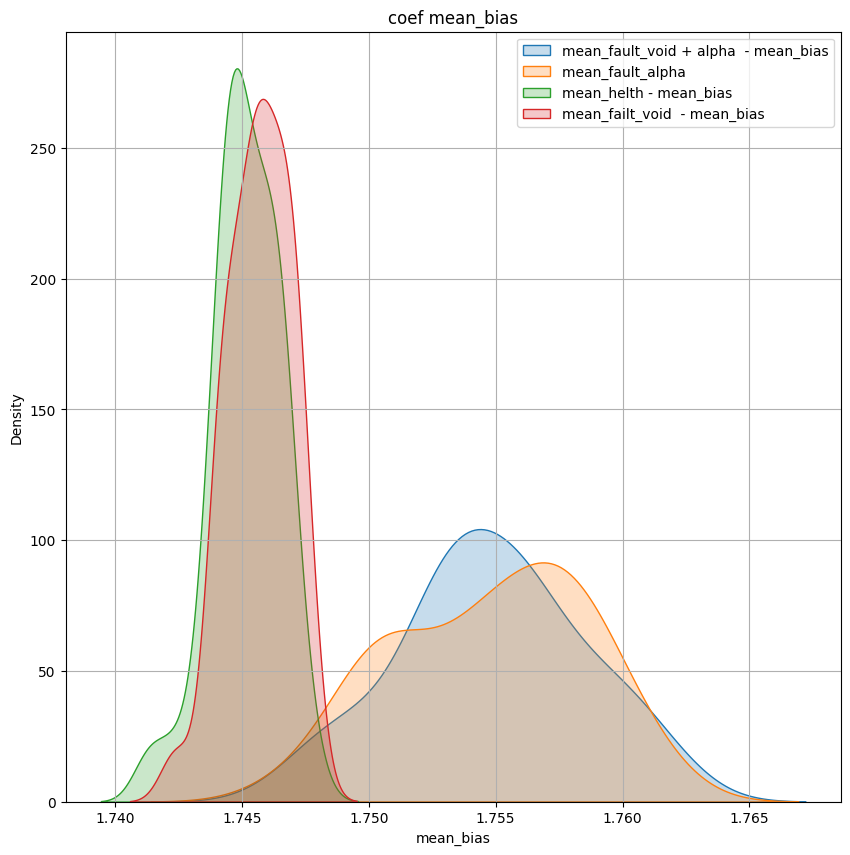

<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:5: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning

mean fault t :  0.0  - mean fault :  0.0  - mean health :  0.0


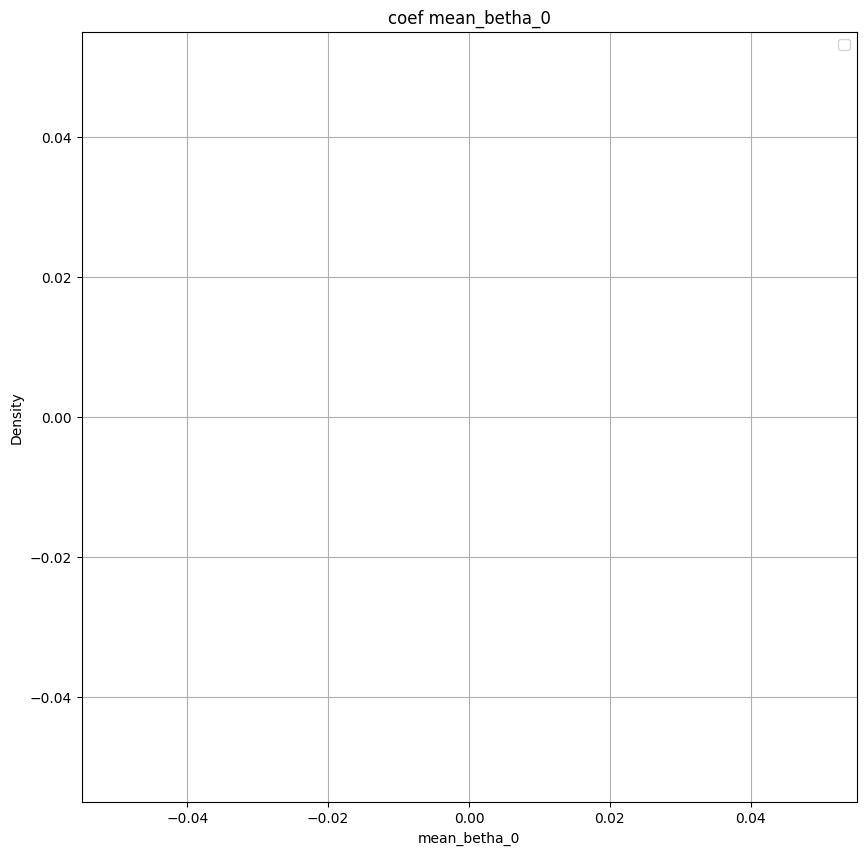

mean fault t :  -1.0637430629292852  - mean fault :  -1.063545982416633  - mean health :  -1.055338527390838


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

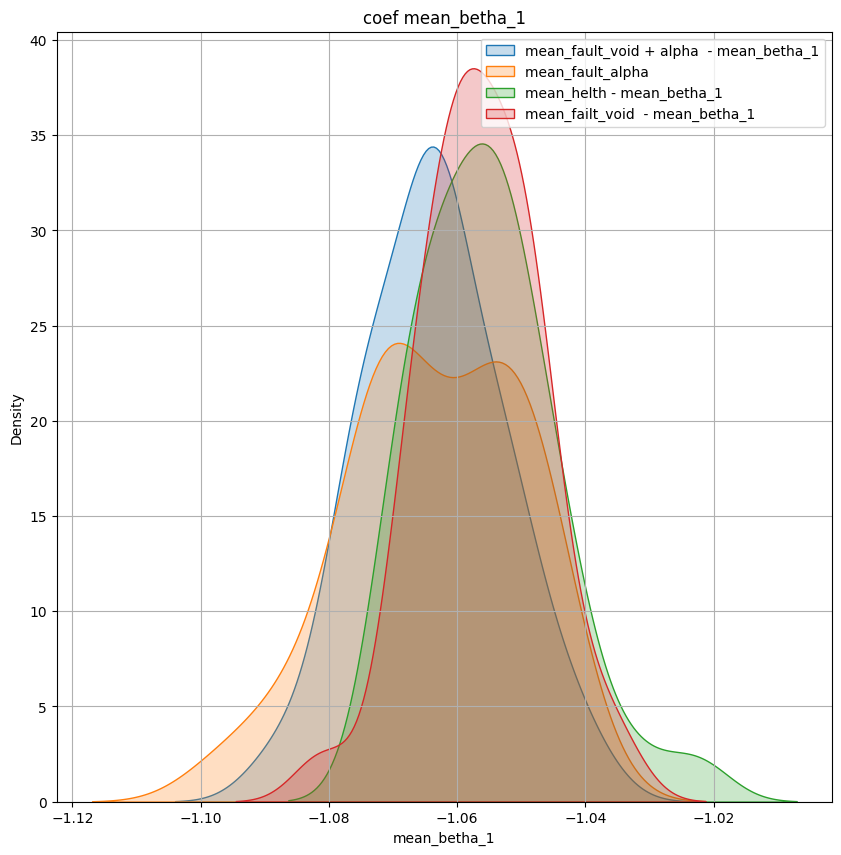

mean fault t :  -0.0718392199559966  - mean fault :  -0.07294708027994536  - mean health :  -0.06933426472331163


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

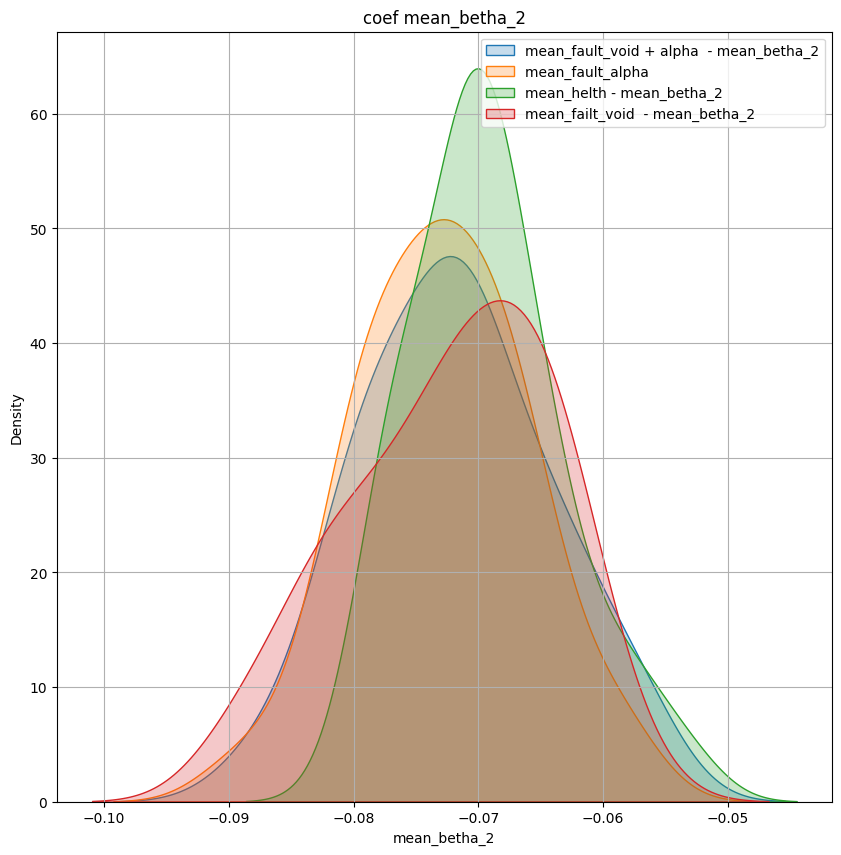

mean fault t :  2.8101821862802256  - mean fault :  2.810647827984106  - mean health :  2.790561416676732


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

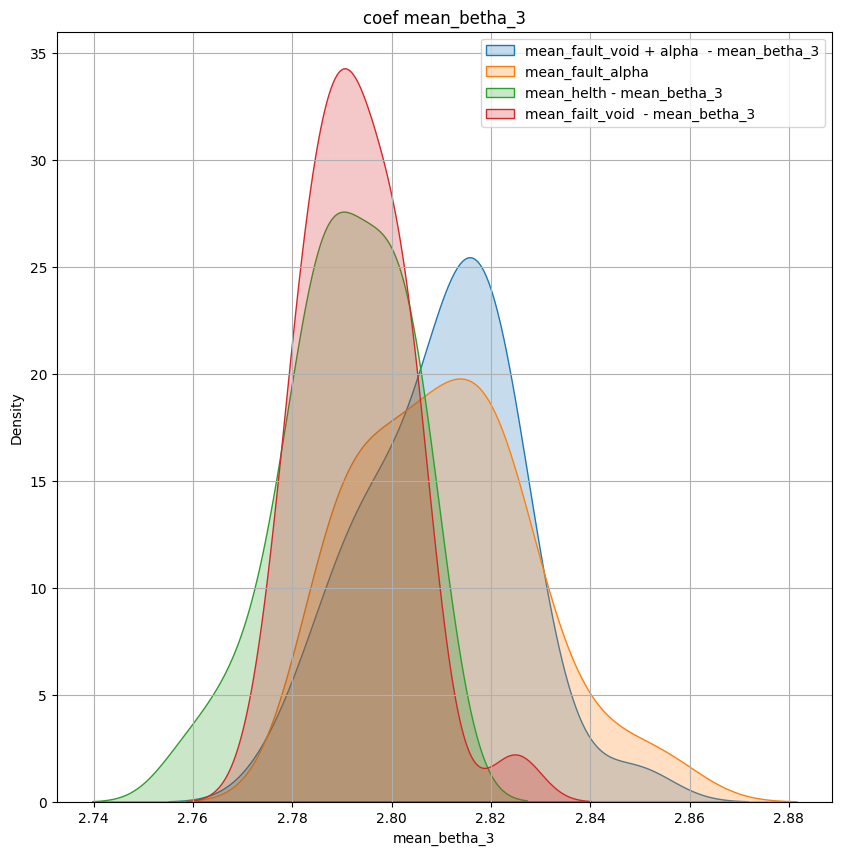

mean fault t :  0.08659007177264325  - mean fault :  0.08835669937815864  - mean health :  0.08572875802512633


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

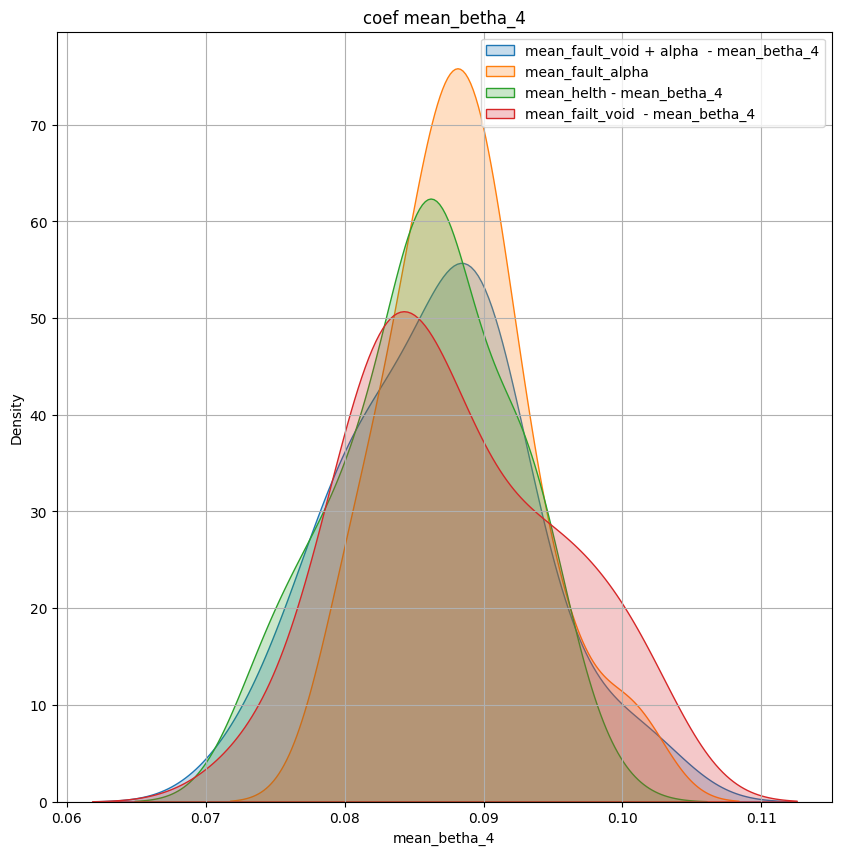

mean fault t :  -0.014435474589736451  - mean fault :  -0.014340195175017686  - mean health :  -0.012790960236695386


<ipython-input-11-96ead9510f57>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
<ipython-input-11-96ead9510f57>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
<ipython-input-11-96ead9510f57>:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
<ipython-input-11-96ead9510f57>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This 

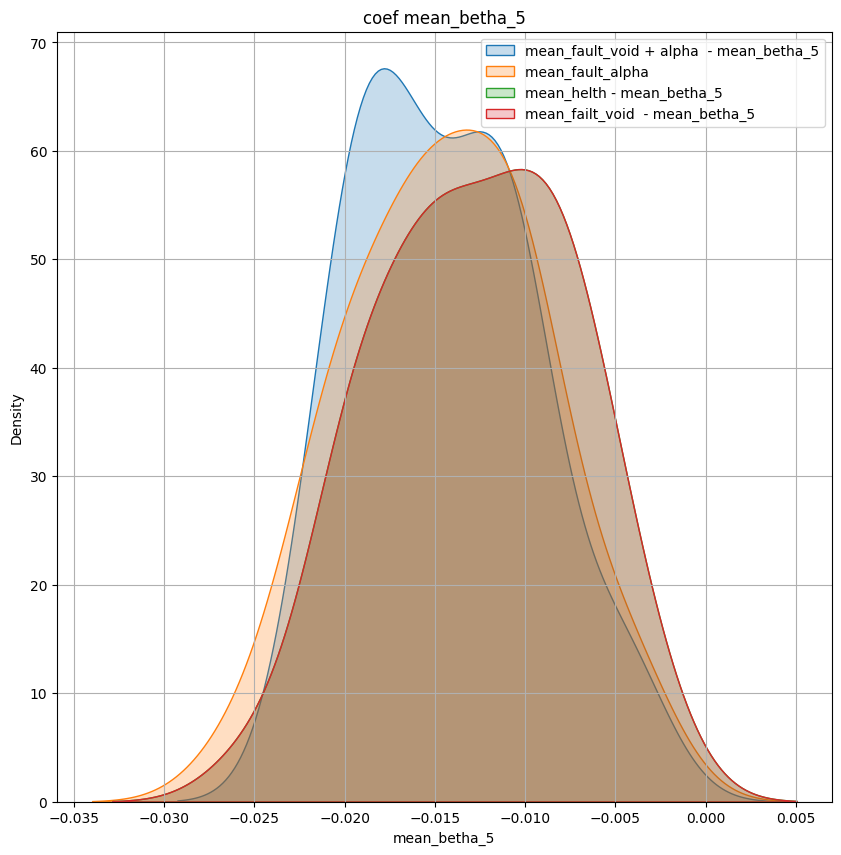

In [11]:
for element in check_columns :
  fig = plt.figure(figsize = (10 , 10 ))
  ax0 = fig.add_subplot(111 )
  print("mean fault t : " , df_fault_t_mean_and_std[element].mean() , " - mean fault : " , df_fault_mean_and_std[element].mean() , " - mean health : " , df_health_mean_and_std[element].mean() )
  sns.kdeplot( df_fault_t_mean_and_std[element]  , label=f'mean_fault_void + alpha  - {element}'  , shade=True )
  sns.kdeplot( df_fault_mean_and_std[element] , label=f'mean_fault_alpha '  , shade=True  )
  sns.kdeplot(df_health_mean_and_std[element] , label=f'mean_helth - {element} ' ,  shade=True  )
  sns.kdeplot(df_health_t_mean_and_std[element] , label=f'mean_failt_void  - {element} ' ,  shade=True  )
  plt.legend()
  plt.title(f"coef {element}")
  plt.grid()
  plt.show()

In [19]:
df_result = pd.DataFrame(total_simulation)


In [20]:
df_result.columns

Index(['bias_correlation', 'betha_0_correlation', 'betha_1_correlation',
       'betha_2_correlation', 'betha_3_correlation', 'betha_4_correlation',
       'betha_5_correlation', 'alpha', 'flap', 'accuracy_nav',
       'accuracy_random_forest', 'n_estimators_RF', 'max_features_RF',
       'max_depth_RF', 'criterion_RF', 'accuracy_extra_classifier',
       'accuracy_svc_', 'C_svc', 'kernel_svc', 'gamma_svc', 'ann'],
      dtype='object')

In [21]:
df_result.head(5)

,bias_correlation,betha_0_correlation,betha_1_correlation,betha_2_correlation,betha_3_correlation,betha_4_correlation,betha_5_correlation,alpha,flap,accuracy_nav,...,n_estimators_RF,max_features_RF,max_depth_RF,criterion_RF,accuracy_extra_classifier,accuracy_svc_,C_svc,kernel_svc,gamma_svc,ann
0,0.005823,NaN,0.001001,0.003920,0.005154,0.006791,0.014571,0.001,1,0.227273,...,200,sqrt,8,entropy,0.313131,0.318182,100,rbf,0.1,0.366162
1,0.005453,NaN,-0.001781,0.025367,0.007664,-0.014624,0.031132,0.001,2,0.222222,...,200,sqrt,4,gini,0.292929,0.343434,1000,rbf,0.1,0.431818
2,0.007594,NaN,0.019759,0.033610,-0.014438,-0.029723,0.031067,0.001,3,0.260101,...,200,sqrt,5,gini,0.262626,0.351010,100,rbf,0.1,0.373737
3,0.005758,NaN,0.005867,-0.043981,0.004558,0.017767,-0.040836,0.001,4,0.262626,...,200,sqrt,7,gini,0.308081,0.343434,100,rbf,0.1,0.388889
4,0.010872,NaN,0.016624,0.012214,-0.009678,-0.036455,-0.013340,0.002,1,0.222222,...,200,sqrt,8,gini,0.287879,0.330808,100,rbf,0.1,0.378788


In [22]:
df_svc_group = df_result.groupby(['alpha' , 'flap' ]).agg({'accuracy_svc_' : ['max'] , 'accuracy_nav':['max'] , 'accuracy_extra_classifier' : ['max'] , 'ann':['max']})

In [24]:
df_result.to_csv('def_result.csv' , index = False )

In [23]:
df_svc_group

accuracy_svc_ accuracy_nav accuracy_extra_classifier       ann
                     max          max                       max       max
alpha flap                                                               
0.001 1         0.318182     0.227273                  0.313131  0.366162
      2         0.343434     0.222222                  0.292929  0.431818
      3         0.351010     0.260101                  0.262626  0.373737
      4         0.343434     0.262626                  0.308081  0.388889
0.002 1         0.330808     0.222222                  0.287879  0.378788
      2         0.328283     0.229798                  0.318182  0.358586
      3         0.310606     0.222222                  0.262626  0.421717
      4         0.335859     0.250000                  0.282828  0.419192
0.003 1         0.366162     0.229798                  0.325758  0.388889
      2         0.351010     0.209596                  0.320707  0.373737
      3         0.351010     0.252525                  0.305556  0.381313
      4         0.363636     0.239899                  0.282828  0.297980
0.004 1         0.358586     0.237374                  0.300505  0.409091
      2         0.320707     0.222222                  0.328283  0.368687
      3         0.340909     0.280303                  0.282828  0.457071
      4         0.328283     0.227273                  0.295455  0.434343
0.005 1         0.318182     0.262626                  0.282828  0.429293
      2         0.348485     0.255051                  0.257576  0.351010
      3         0.335859     0.217172                  0.308081  0.340909
      4         0.323232     0.229798                  0.290404  0.391414
0.006 1         0.345960     0.239899                  0.295455  0.356061
      2         0.338384     0.232323                  0.310606  0.356061
      3         0.363636     0.217172                  0.280303  0.398990
      4         0.363636     0.242424                  0.303030  0.441919
0.007 1         0.333333     0.237374                  0.313131  0.454545
      2         0.315657     0.237374                  0.280303  0.305556
      3         0.345960     0.217172                  0.315657  0.356061
      4         0.338384     0.252525                  0.310606  0.419192
0.008 1         0.333333     0.272727                  0.300505  0.378788
      2         0.396465     0.262626                  0.305556  0.315657
      3         0.348485     0.250000                  0.277778  0.449495
      4         0.358586     0.255051                  0.290404  0.414141
0.009 1         0.348485     0.219697                  0.323232  0.444444
      2         0.371212     0.250000                  0.320707  0.416667
      3         0.398990     0.260101                  0.340909  0.469697
      4         0.371212     0.247475                  0.315657  0.441919

In [ ]:
df_svc_group.plot(x = 'alpha' , y = 'accuracy_svc_mean')

KeyError: 'alpha'

IndexError: single positional indexer is out-of-bounds

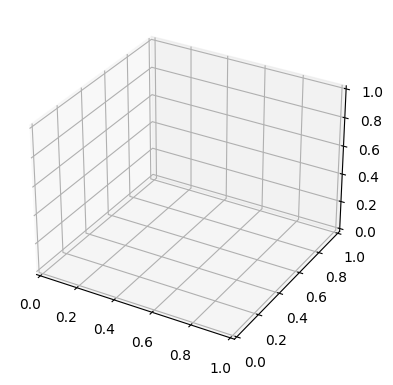

In [ ]:
fig = plt.figure(figsize = (10 , 10 ))
ax0 = fig.add_subplot( 1 , 2 , 1 , projection = "3d" )
ax0.scatter3D(df_svc_group.iloc[: , 0 ] , df_svc_group.iloc[: , 1 ] , df_svc_group[: , 3])
plt.legend()
plt.grid()
plt.show()

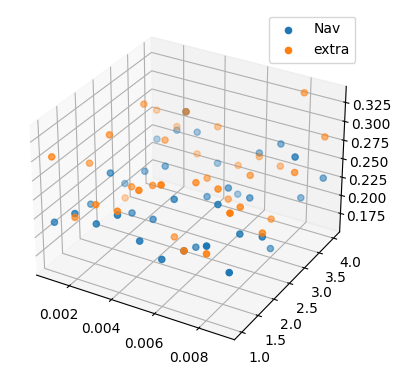

In [ ]:
fig = plt.figure(figsize = (10 , 10 ))
ax0 = fig.add_subplot( 1 , 2 , 1 , projection = "3d" )
ax0.scatter3D(df_result.iloc[ : , 7 ] ,df_result.iloc[ : , 8 ] , df_result.iloc[ : , 9] , label='Nav')
ax0.scatter3D(df_result.iloc[ : , 7 ] ,df_result.iloc[ : , 8 ] , df_result.iloc[ : , 15] , label='extra')
plt.legend()
plt.grid()
plt.show()

In [ ]:
df_result.head()

,bias_correlation,betha_0_correlation,betha_1_correlation,betha_2_correlation,betha_3_correlation,betha_4_correlation,betha_5_correlation,alpha,flap,accuracy_nav,...,n_estimators_RF,max_features_RF,max_depth_RF,criterion_RF,accuracy_extra_classifier,accuracy_svc_,C_svc,kernel_svc,gamma_svc,ann
0,0.007115,NaN,-0.001560,-0.027838,0.008445,-0.000331,-0.050312,0.001,1,0.217172,...,200,sqrt,7,gini,0.303030,0.292929,100,rbf,0.1,0.292929
1,0.011908,NaN,-0.063130,0.004665,0.074168,-0.012625,-0.013266,0.001,2,0.202020,...,200,sqrt,6,gini,0.257576,0.262626,100,rbf,0.1,0.222222
2,-0.001903,NaN,0.111843,0.081080,-0.116957,-0.043259,0.086272,0.001,3,0.191919,...,500,sqrt,4,gini,0.171717,0.227273,1000,rbf,0.1,0.247475
3,0.010665,NaN,-0.047247,-0.006350,0.062016,0.023407,0.007212,0.001,4,0.217172,...,200,sqrt,4,gini,0.257576,0.196970,1,linear,1.0,0.207071
4,0.012002,NaN,0.020867,-0.013689,-0.008903,-0.009562,-0.039834,0.002,1,0.237374,...,200,sqrt,7,gini,0.232323,0.308081,100,rbf,0.1,0.257576


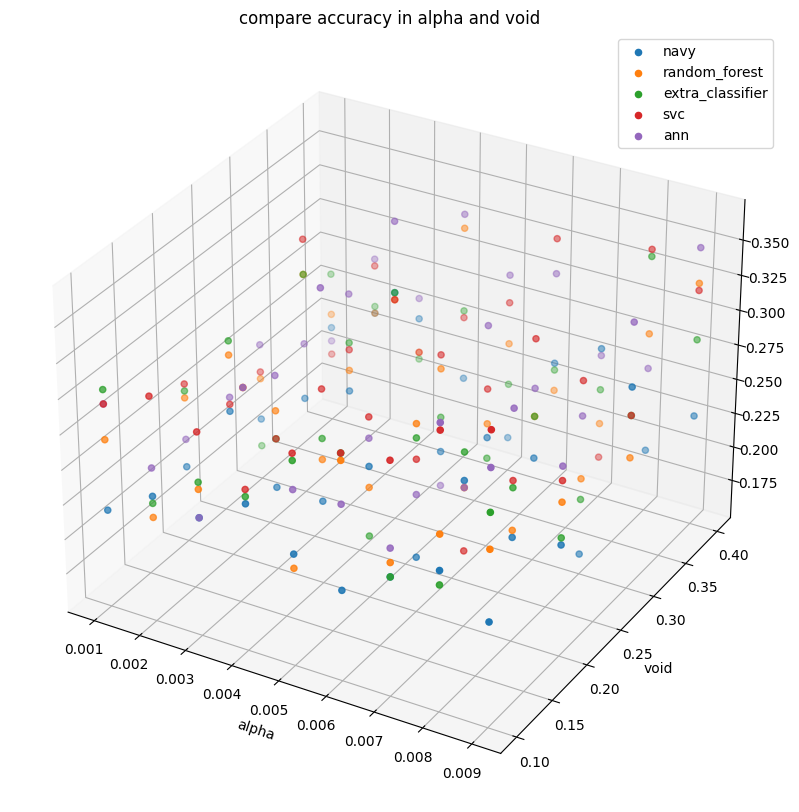

In [ ]:
fig = plt.figure(figsize = (10 , 10 ))
ax0 = fig.add_subplot( projection='3d' )
ax0.scatter3D( df_result.iloc[ : , 7 ] , df_result.iloc[ : , 8 ]/10 , df_result.iloc[ : , 9 ] , label = 'navy')
ax0.scatter3D( df_result.iloc[ : , 7 ] , df_result.iloc[ : , 8 ]/10 , df_result.iloc[ : , 10] , label = 'random_forest')
ax0.scatter3D( df_result.iloc[ : , 7 ] , df_result.iloc[ : , 8 ]/10 , df_result.iloc[ : , 15] , label = 'extra_classifier')
ax0.scatter3D( df_result.iloc[ : , 7 ] , df_result.iloc[ : , 8 ]/10 , df_result.iloc[ : , 16] , label = 'svc')
ax0.scatter3D( df_result.iloc[ : , 7 ] , df_result.iloc[ : , 8 ]/10 , df_result.iloc[: , -1 ] , label = 'ann')
plt.title("compare accuracy in alpha and void  ")
plt.xlabel("alpha")
plt.ylabel("void")
plt.legend()
plt.grid()
plt.show()

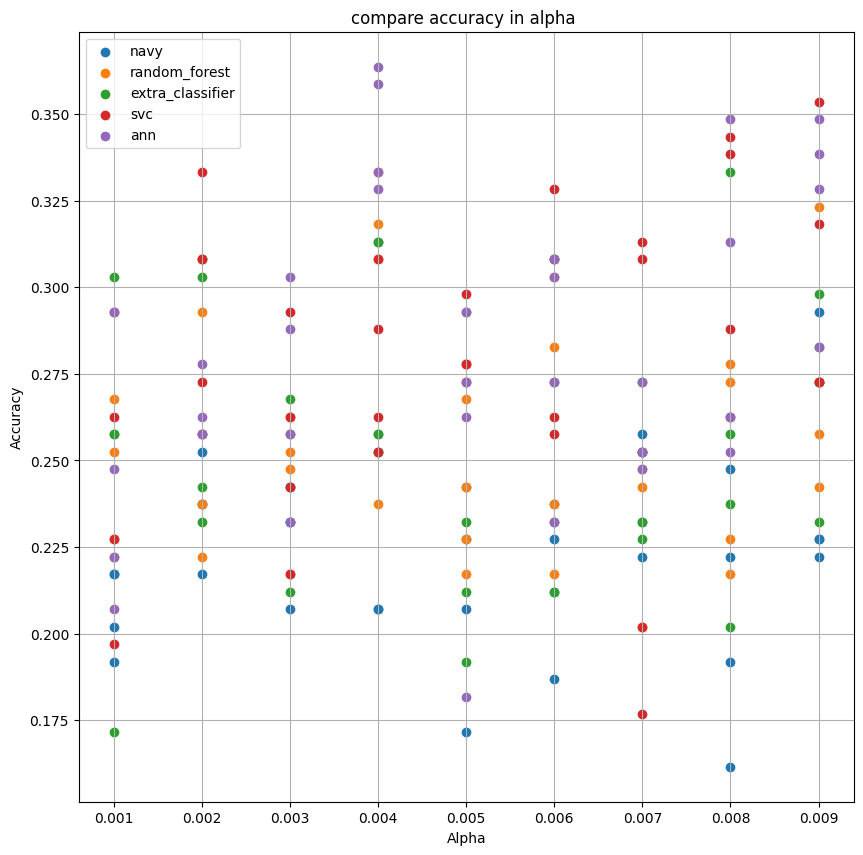

In [ ]:
fig = plt.figure(figsize = (10 , 10 ))
ax0 = fig.add_subplot( )
ax0.scatter( df_result.iloc[ : , 7 ] ,  df_result.iloc[ : , 9 ] , label = 'navy')
ax0.scatter( df_result.iloc[ : , 7 ] ,  df_result.iloc[ : , 10] , label = 'random_forest')
ax0.scatter( df_result.iloc[ : , 7 ] ,  df_result.iloc[ : , 15] , label = 'extra_classifier')
ax0.scatter( df_result.iloc[ : , 7 ] ,  df_result.iloc[ : , 16] , label = 'svc')
ax0.scatter( df_result.iloc[ : , 7 ] ,  df_result.iloc[: , -1 ] , label = 'ann')
plt.title("compare accuracy in alpha ")
plt.xlabel("Alpha")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

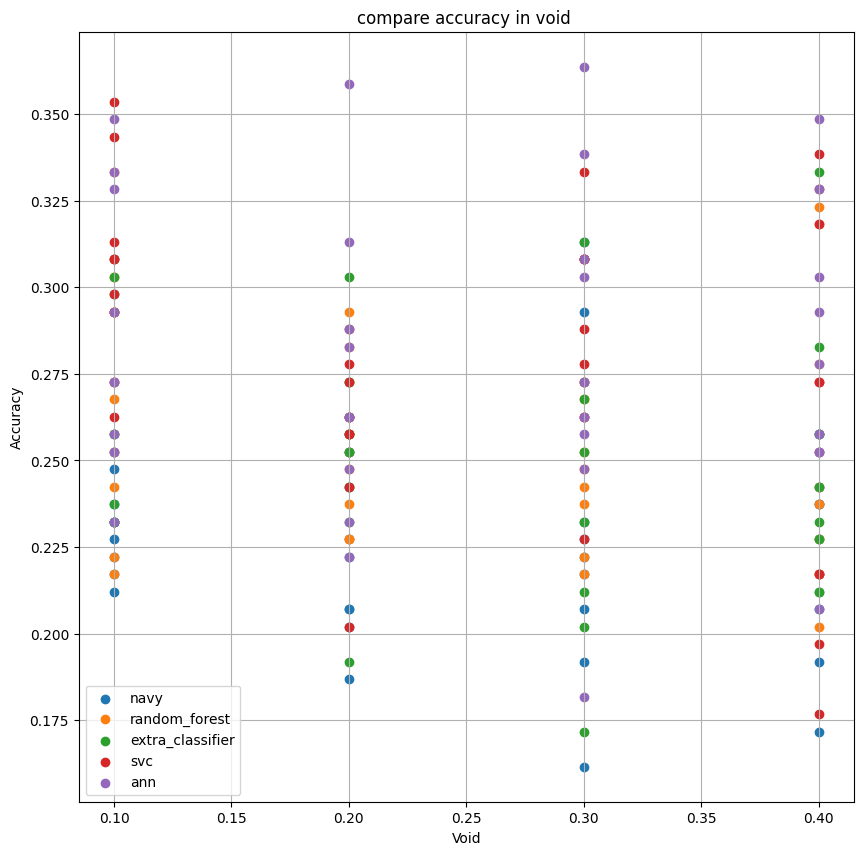

In [ ]:
fig = plt.figure(figsize = (10 , 10 ))
ax0 = fig.add_subplot( )
ax0.scatter( df_result.iloc[ : , 8 ]/10 ,  df_result.iloc[ : , 9 ] , label = 'navy')
ax0.scatter( df_result.iloc[ : , 8 ]/10 ,  df_result.iloc[ : , 10] , label = 'random_forest')
ax0.scatter( df_result.iloc[ : , 8 ]/10 ,  df_result.iloc[ : , 15] , label = 'extra_classifier')
ax0.scatter( df_result.iloc[ : , 8 ]/10 ,  df_result.iloc[ : , 16] , label = 'svc')
ax0.scatter( df_result.iloc[ : , 8 ]/10 ,  df_result.iloc[: , -1 ] , label = 'ann')
plt.title("compare accuracy in void ")
plt.ylabel("Accuracy")
plt.xlabel("Void")
plt.legend()
plt.grid()
plt.show()

In [ ]:
df_result.groupby("alpha" , "flap").agg({'navy':[]})

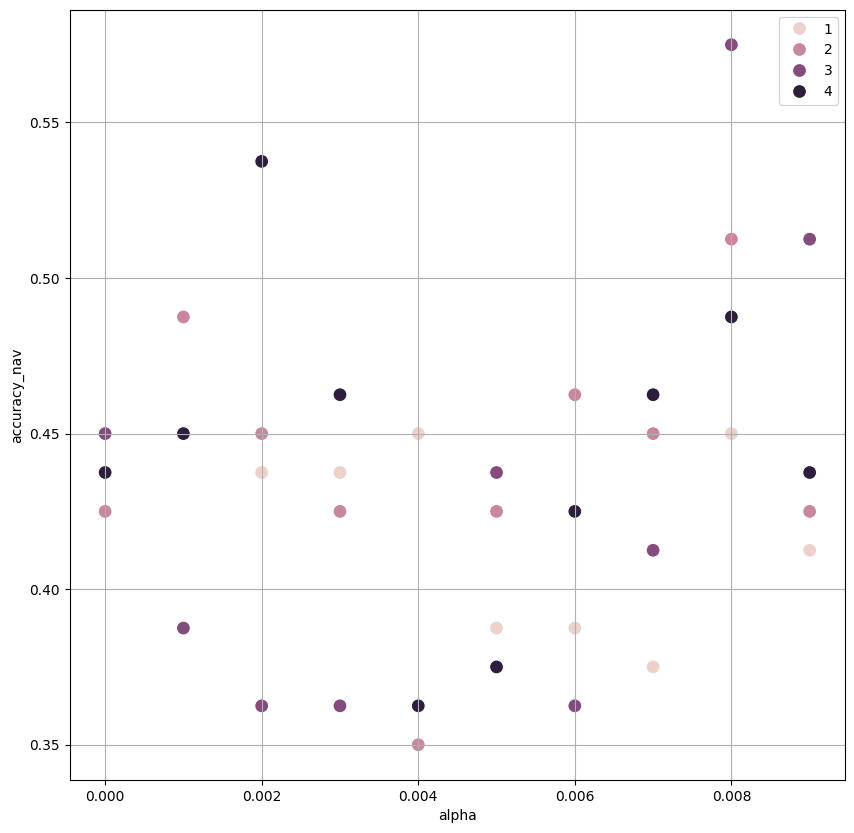

In [ ]:
plt.figure(figsize = (10 , 10 ))
sns.scatterplot(data=df_result, x="alpha", y="accuracy_nav", hue="flap" , s = 100  )
plt.legend()
plt.grid()
plt.show()

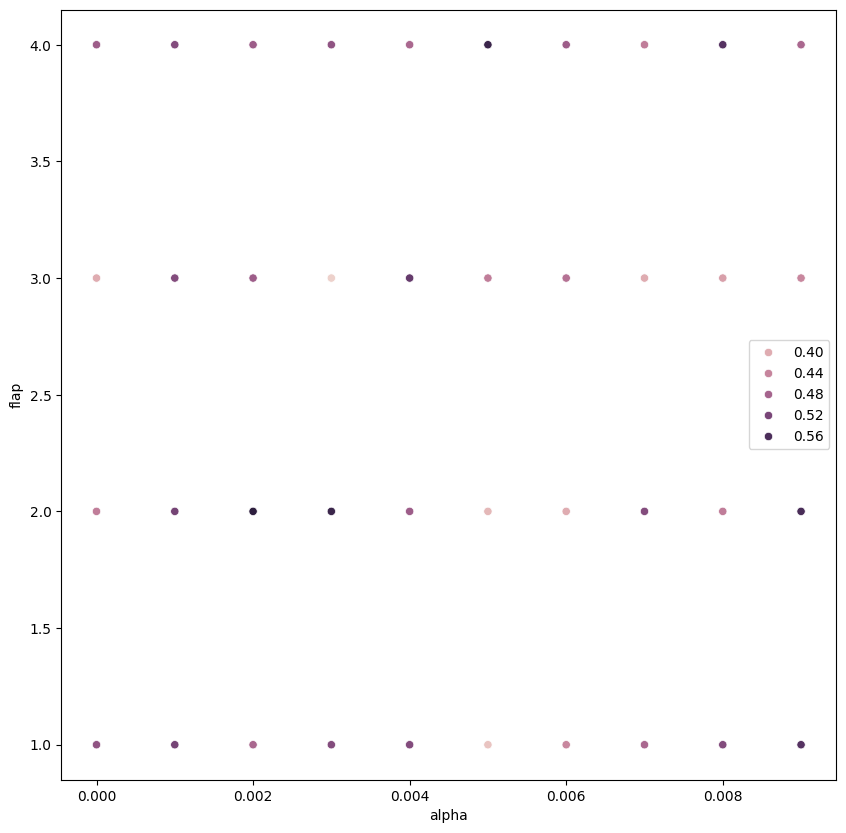

In [ ]:
plt.figure(figsize=(10 , 10 ))
sns.scatterplot(data=df_result, x="alpha", y="flap", hue="accuracy_svc_", hue_order = ["linear" , "rbf" ] )
plt.legend()
plt.show()

In [ ]:
df_result['flap'].unique()

array([1, 2, 3, 4])

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

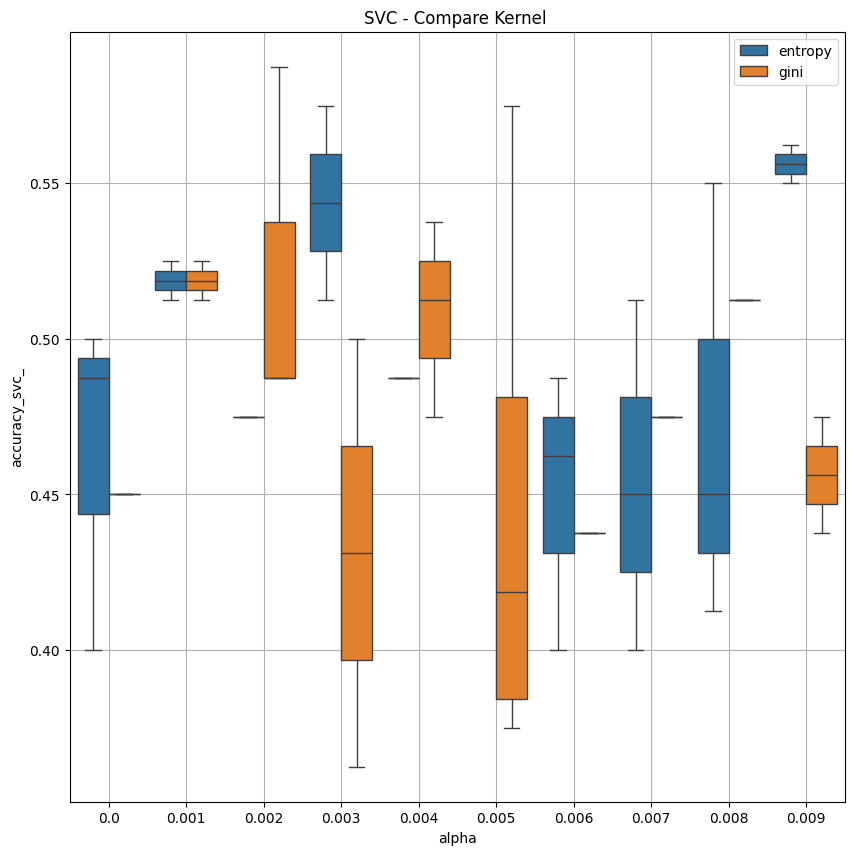

In [ ]:
plt.figure(figsize = (10 , 10 )  )
sns.boxplot(x="alpha", y="accuracy_svc_" , hue='criterion_RF', data = df_result )
plt.title("SVC - Compare Kernel " )
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

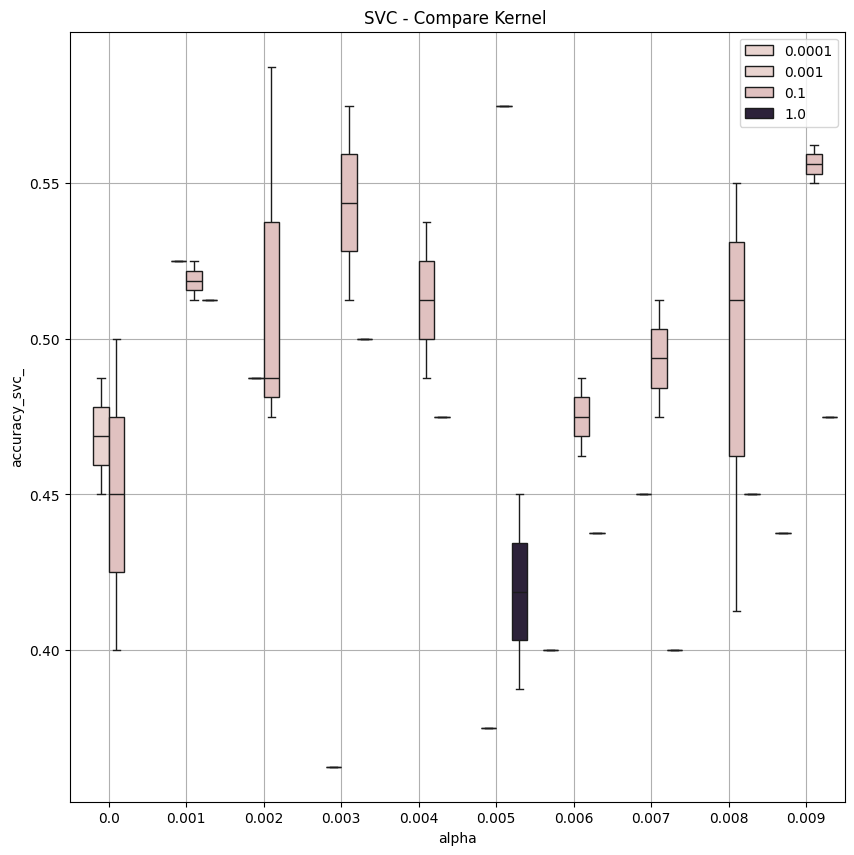

In [ ]:
plt.figure(figsize = (10 , 10 )  )
sns.boxplot(x="alpha", y="accuracy_svc_" , hue='gamma_svc', data = df_result )
plt.title("SVC - Compare Kernel " )
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

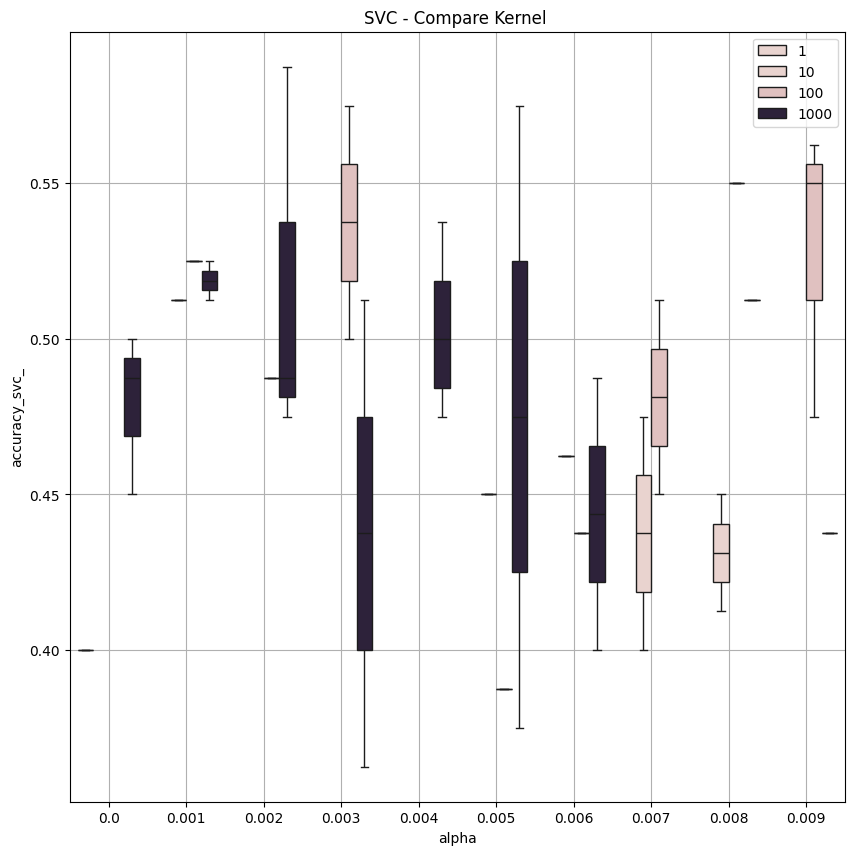

In [ ]:
plt.figure(figsize = (10 , 10 )  )
sns.boxplot(x="alpha", y="accuracy_svc_" , hue='C_svc', data = df_result )
plt.title("SVC - Compare Kernel " )
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


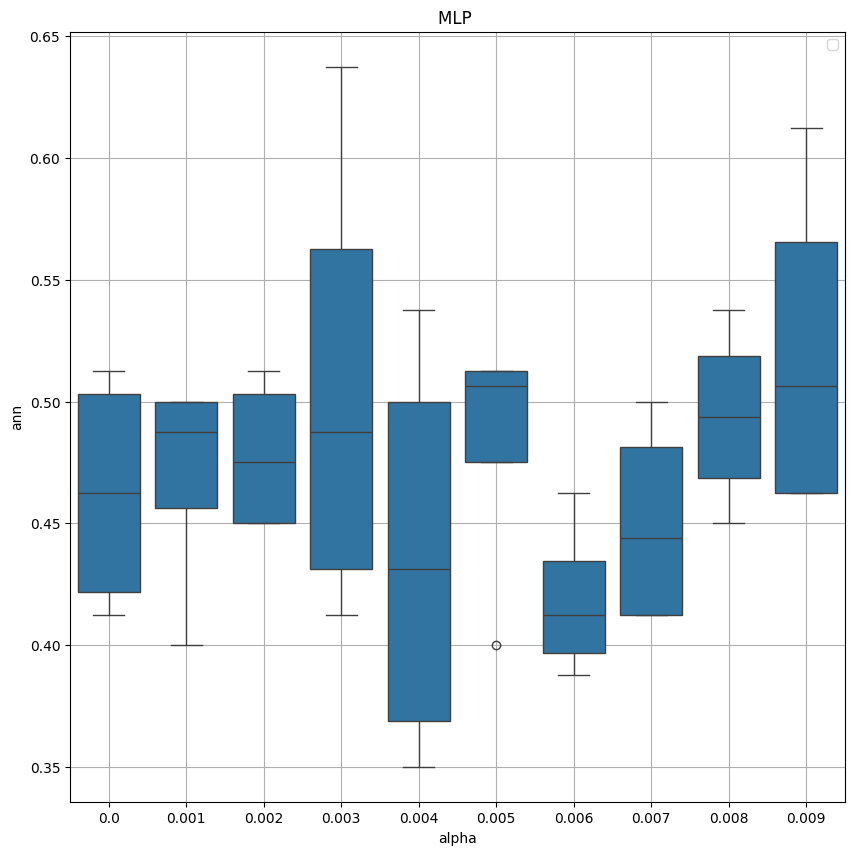

In [ ]:
plt.figure(figsize = (10 , 10 )  )
sns.boxplot(x="alpha", y="ann" , data = df_result )
plt.title("MLP " )
plt.legend()
plt.grid()
plt.show()
accuracy_nav

In [ ]:
plt.figure(figsize = (10 , 10 )  )
sns.boxplot(x="alpha", y="accuracy_nav" , hue="flap" , data = df_result )
plt.title("MLP " )
plt.legend()
plt.grid()
plt.show()
